In [1]:
#Imports
from src.PCA import ComputeCovariance
from src.dim_red_viz import visualize_manifold_method
#REDO this to just import a function
from src.data.dimensionality_reduction.choose_dimension import choose_dimension
import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy as sp
from rpy2.robjects.packages import importr
import rpy2.robjects as ro
from rpy2.robjects import r, pandas2ri
from sklearn.manifold import Isomap, SpectralEmbedding, LocallyLinearEmbedding
from copy import copy 
from sklearn.manifold import trustworthiness
from kneed import DataGenerator, KneeLocator
from rpy2.robjects.conversion import localconverter
import pickle

In [2]:
STATE = 'tx'

In [3]:
#Load the data
covid_ga = pd.read_csv('/home/rlevin/notebooks/notebooks/datadrivenmethodsforgemspoliocovid/data/raw/covid/stayathome-texas.csv')
covid_ga_ = covid_ga.set_index('Unnamed: 0')
covid_ga_ = covid_ga_[covid_ga_.columns[:117]] #to consider the same time period with our WA analysis
#Prepare the data: drop nans
X = covid_ga_.dropna().values
index_X = covid_ga_.dropna().index
columns_X = covid_ga_.dropna().columns
X.shape, covid_ga_.shape

((15719, 117), (15763, 117))

In [4]:
#Define functions
import scipy
from datetime import datetime
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.manifold import Isomap

def convert_to_python_dict(mc):
    return dict(zip(mc.names, list(mc)))

def save_obj(obj, name ):
    with open('obj/'+ name + '.pkl', 'wb') as f:
        pickle.dump(obj, f, pickle.HIGHEST_PROTOCOL)

def load_obj(name ):
    with open('obj/' + name + '.pkl', 'rb') as f:
        return pickle.load(f)
    
def find_closest_time_series(SE_behavior, SE_means, covid_, n = 5):
    """Finds n closest time series to the cluster means (or the vectors in SE_means)
    returns dict with keys V1...V6 cluster names and values dataframes with the n closest samples
    same for block_ids    
    """
    #ADD index_X here!!!
    closest_to_mean_samples = {}
    closest_to_mean_block_ids = {}
    for cluster in SE_means.columns:
        sorted_indices = np.squeeze(np.argsort(scipy.spatial.distance.cdist(SE_behavior, SE_means[cluster][None,:], metric='euclidean'), axis = 0))
        closest_to_mean_samples[cluster] = covid_.loc[index_X[sorted_indices[:n]]] #Take the closest n points
        closest_to_mean_block_ids[cluster] = index_X[sorted_indices[:n]]
    return closest_to_mean_samples, closest_to_mean_block_ids


def plot_time_series(time_series_df, name = 'time_series_of_interest', filename = None, only_melt = False):
    FIGURES_PATH = '/home/rlevin/notebooks/notebooks/datadrivenmethodsforgemspoliocovid/reports/figures/'
    time_series_df_ = time_series_df.copy().T
    time_series_df_['dates'] = pd.to_datetime(time_series_df.columns)
    #closest_to_mean_sample_ = closest_to_mean_sample.T
    #closest_to_mean_sample_['dates'] = pd.to_datetime(columns_X)
#     closest_to_mean_sample_
    #Cluster means figure
    sns.set(style="darkgrid")
    melted_df = pd.melt(time_series_df_,
                        id_vars=['dates'], # Variables to keep
                        var_name="Block")
    if only_melt:
        return melted_df
    g = sns.relplot(x = 'dates', y="value", row = 'Block', 
                    kind="line", row_order=time_series_df.index, data=melted_df, sort = False, aspect = 5, marker='o')
    g.fig.autofmt_xdate(0,10)
    plt.subplots_adjust(top=0.93)
    g.fig.suptitle(name, size = 'xx-large')
    g.set(ylim=(0, 1))


    #Add the important dates
    # ax = g.axes[1]

    for axs in g.axes:
        axs[0].axvline(datetime(2020, 2, 29), color = 'green', ls='--', label='emergency_WA')
        axs[0].axvline(datetime(2020, 3, 3), color = 'blue', ls='--', label='emergency_Seattle')
        axs[0].axvline(datetime(2020, 3, 11), color = 'red', ls='--', label='events_ban')
        axs[0].axvline(datetime(2020, 3, 12), color = 'brown', ls='--', label='schools')
        axs[0].axvline(datetime(2020, 3, 15), color = 'green', ls='-', label='restrautrants')
        axs[0].axvline(datetime(2020, 3, 21), color = 'blue', ls='-', label='Everett_stay_home')
        axs[0].axvline(datetime(2020, 3, 23), color = 'red', ls='-', label='stay-at-home')
        axs[0].axvline(datetime(2020, 3, 25), color = 'brown', ls='-', label='WA_parks_closed')
        axs[0].axvline(datetime(2020, 3, 31), color = 'green', ls='-.', label='National_guard_WA')
        axs[0].axvline(datetime(2020, 4, 2), color = 'blue', ls='-.', label='stay-at-home_extended')

        axs[0].legend()

    # ax[0].text(0.5,25, "Some text")
    if filename is not None:
        g.fig.savefig(FIGURES_PATH+filename, bbox_inches = 'tight')
    
    return melted_df
        
def viz_blocks_on_the_map(block_ids, name = 'blocks_of_interest', filename = None):#, washington_ = washington_):
    FIGURES_PATH = '/home/rlevin/notebooks/notebooks/datadrivenmethodsforgemspoliocovid/reports/figures/'
    washington = gpd.read_file('/home/rlevin/notebooks/notebooks/datadrivenmethodsforgemspoliocovid/data/external/washington_blockgroup_shape/tl_2015_53_bg/tl_2015_53_bg.shp')
#     washington_ = washington.copy()
#     washington_.GEOID = washington_.GEOID.astype('int')
#     washington_ = washington_.set_index('GEOID')
    washington['blocks_of_interest'] = False
    washington['blocks_of_interest'][washington.GEOID.astype('int').isin(block_ids.astype('int'))] = True
#     colors = pd.DataFrame(colors, columns = ['c'])
#     colors['block_ind'] = index_X
#     colors = colors.set_index('block_ind')
#     washington_['colormap'] = colors['c']
    fig, ax = plt.subplots(figsize=(12, 10))
    ax.axis('off')
    washington.plot(column = 'blocks_of_interest', ax = ax, legend = False, edgecolor="face", cmap = 'OrRd',
                    linewidth=0.4, legend_kwds={'label': 'Cluster','orientation': "horizontal"})
    ax.set(title=name)
    if filename is not None:
        fig.savefig(FIGURES_PATH+filename, bbox_inches = 'tight')
        
def viz_SE(X, colors, filename = None, alpha = None, subselect = slice(None)): 
    #Try Spectral Embedding
    from sklearn.manifold import SpectralEmbedding

    emb_method = SpectralEmbedding

    hyperparams_to_test = {}#{'n_neighbors': [50, 50]}
#     colors = colors#labels_multirun['Labels_3']#SE_clusters['x'].values
    SE_X_2D_emb, SE_X_3D_emb = visualize_manifold_method(X, emb_method, hyperparams_to_test, colors, '', filename = filename, alpha = alpha, subselect = subselect, **{'n_neighbors': 50,
     'n_components': 2,
     'n_jobs': -1})
    
    return SE_X_2D_emb, SE_X_3D_emb


        
def viz_Isomap(X, colors, filename = None, alpha = None, subselect = slice(None)):
    emb_method = Isomap
    hyperparams_to_test = {}#{'n_neighbors': [50, 50]}
#     colors = colors#SE_clusters['x'].values#lusters[:,1]

    Isomap_X_2D_emb, Isomap_X_3D_emb = visualize_manifold_method(X, emb_method, hyperparams_to_test, colors,
                              '', filename = filename, 
                              alpha = alpha, subselect = subselect, **{'n_neighbors': 50, 
                                                                    'n_components': 2, 
                                                                    'max_iter': 1000, 
                                                                    'n_jobs': -1})
    return Isomap_X_2D_emb, Isomap_X_3D_emb
    
def viz_LLE(X, colors, filename = None, alpha = None, subselect = slice(None)):
    #Try LLE, standard, tweaked parameters a little
    from sklearn.manifold import LocallyLinearEmbedding

    emb_method = LocallyLinearEmbedding
    hyperparams_to_test = {}#'n_neighbors': [200, 200],
    # colors = clusters[:,1]


    LLE_X_2D_emb, LLE_X_3D_emb = visualize_manifold_method(X, emb_method, hyperparams_to_test, colors,
                              '', filename = filename, 
                              alpha = alpha, subselect = subselect, **{'n_neighbors': 200,
                                                                       'n_components': 2,
                                                                       'reg': 0.1,
                                                                       'eigen_solver': 'auto',
                                                                       'tol': 1e-06,
                                                                       'max_iter': 1000,
                                                                       'method': 'standard',
                                                                       'hessian_tol': 0.0001,
                                                                       'modified_tol': 1e-12,
                                                                       'neighbors_algorithm': 'auto',  
                                                                       'random_state': None,
                                                                       'n_jobs': -1})
    return LLE_X_2D_emb, LLE_X_3D_emb
    
    
def viz_cluster_map(colors, index_X, filename = None):#, washington_ = washington_):
    FIGURES_PATH = '/home/rlevin/notebooks/notebooks/datadrivenmethodsforgemspoliocovid/reports/figures/'
    #FIX THIS FOR OTHER STATES!
    washington = gpd.read_file('/home/rlevin/notebooks/notebooks/datadrivenmethodsforgemspoliocovid/data/external/texas_blockgroup_shape/tl_2016_48_bg/tl_2016_48_bg.shp')
    washington_ = washington.copy()
    washington_.GEOID = washington_.GEOID.astype('int')
    washington_ = washington_.set_index('GEOID')
    
    colors = pd.DataFrame(colors, columns = ['c'])
    colors['block_ind'] = index_X
    colors = colors.set_index('block_ind')
    washington_['colormap'] = colors['c']
    fig, ax = plt.subplots(figsize=(12, 10))
    ax.axis('off')
    washington_.plot(column = 'colormap', ax = ax, legend = True, edgecolor="face", linewidth=0.4, legend_kwds={'label': 'Cluster','orientation': "horizontal"})
    ax.set(title='GMM Clustering')
    if filename is not None:
        fig.savefig(FIGURES_PATH + filename, bbox_inches = 'tight')

        
def create_walk_df(X_emb, similarity, index):
    """X_emb -- embedding,
    similarity -- to sort by in the walk, colormap, the same dimension with X_emb
    index -- non-artifact index e.g., to subselect
    """
    similarities_non_artifact = similarity[index]
    X_walk = X_emb[index]
    X_walk_df = pd.DataFrame(X_walk, columns = ['Mode_{}'.format(i) for i in range(X_walk.shape[1])])
    X_walk_df['Similarity'] = similarities_non_artifact
    return X_walk_df.sort_values(by = 'Similarity')#.reset_index(drop = True)

def find_cos_similarity(X_2D_emb):
    right_end = X_2D_emb[np.argmax(X_2D_emb, axis = 0)[0]]
    left_end = X_2D_emb[np.argmin(X_2D_emb, axis = 0)[0]]
    left_end, right_end, np.argmin(X_2D_emb, axis = 0)[0]
    center = (left_end + right_end)/2
    cosine_colors = 1-cosine_similarity([right_end - center], X_2D_emb-center, dense_output=True).flatten()
    return cosine_colors

In [5]:
def return_metric(method, model):
    if method.__name__ == 'Isomap':
        return model.reconstruction_error()
    if method.__name__ == 'TSNE':
        return None # TODO
    return None
    #TODO other methods too

### Choose optimal dimensionality using Isomap, SE and LLE

In [74]:
%%time
#Let's try isomap first
#The best parameters from the vizualization are taken from previous analysis: 50 neighbors
#let's try several n_components
emb_method = Isomap
hyperparams_to_test = {'n_components': np.arange(2, 117, 2)} #CHANGE THIS TO 117!!!

errors_results, embeddings_results, trustws_results = choose_dimension(X, emb_method, hyperparams_to_test, '', **{'n_neighbors': 50, 
                                                                             'n_components': 2, 
                                                                             'max_iter': 1000,
                                                                             'n_jobs': -1})
# hyperparams_to_test = {'n_components': [16]}

# errors_results, embeddings_results, trustws_results = choose_dimension(X, emb_method, hyperparams_to_test, '', **{'n_neighbors': 50, 
#                                                                              'n_components': 2, 
#                                                                              'max_iter': 10,
#                                                                              'n_jobs': -1})

#UNCOMMENT THE ABOVE

here
Trying n_components=2


KeyboardInterrupt: 

In [23]:
save_obj(embeddings_results, 'embeddings_results_isomap')
save_obj(errors_results, 'errors_results_isomap')
save_obj(trustws_results, 'trustws_results_isomap')
# errors_results, embeddings_results, trustws_results

In [19]:
emb_method = Isomap
hyperparams_to_test = {'n_components': np.arange(2, 117, 2)}
embeddings_results = load_obj('embeddings_results_isomap')
errors_results = load_obj('errors_results_isomap')
trustws_results = load_obj('trustws_results_isomap')

In [20]:
# %%time
# #Let's try isomap first
# #The best parameters from the vizualization are taken from previous analysis: 50 neighbors
# #let's try several n_components
# emb_method = Isomap
# hyperparams_to_test = {'n_components': np.arange(30, 117, 2)} #CHANGE THIS TO 117!!!

# errors_results_Isomap, embeddings_results_Isomap, trustws_results_Isomap = choose_dimension(X, emb_method, hyperparams_to_test, '', **{'n_neighbors': 50, 
#                                                                              'n_components': 2, 
#                                                                              'max_iter': 1000,
#                                                                              'n_jobs': -1})
# # hyperparams_to_test = {'n_components': [16]}

# # errors_results, embeddings_results, trustws_results = choose_dimension(X, emb_method, hyperparams_to_test, '', **{'n_neighbors': 50, 
# #                                                                              'n_components': 2, 
# #                                                                              'max_iter': 10,
# #                                                                              'n_jobs': -1})

# #UNCOMMENT THE ABOVE

In [21]:
embeddings_results['n_components'][0].shape

(15719, 2)

<IPython.core.display.Javascript object>


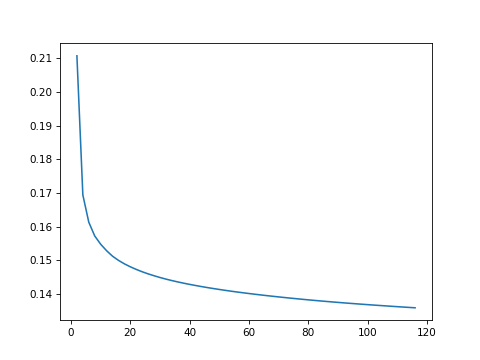

In [22]:
%matplotlib notebook
max_components = 117
#Look at the errors Isomap gives
plt.plot(np.arange(2, max_components, 2), errors_results['n_components'])

<IPython.core.display.Javascript object>


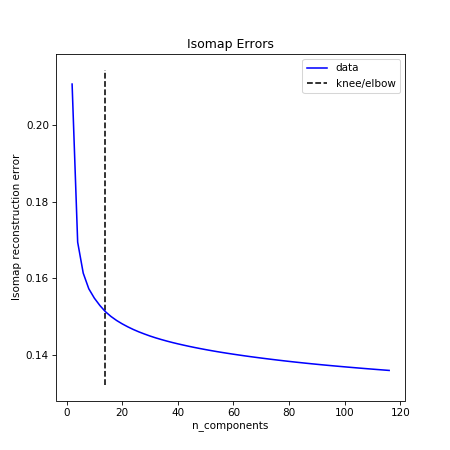

14

In [23]:
# x, y = enumerate(errors['n_components'])
%matplotlib notebook
kneedle = KneeLocator(np.arange(2, max_components, 2), errors_results['n_components'], S=1.0, curve='convex', direction='decreasing')#, interp_method='polynomial')\
kneedle.plot_knee()
plt.title(emb_method.__name__ + ' Errors')
plt.xlabel('n_components')
plt.ylabel('Isomap reconstruction error')
kneedle.elbow

<IPython.core.display.Javascript object>


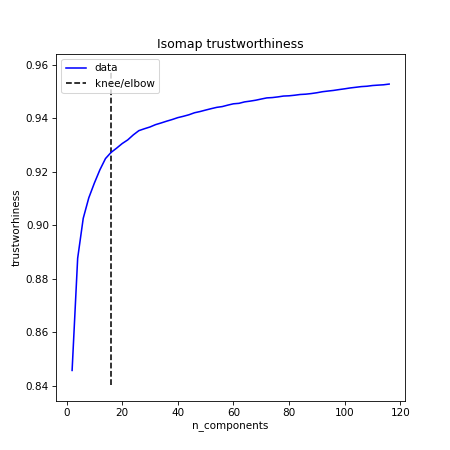

(16, 0.9272611708019295)

In [24]:
kneedle = KneeLocator(np.arange(2, max_components, 2), np.array(trustws_results['n_components']), S=1, curve='concave', direction='increasing', interp_method='polynomial', online = False)
kneedle.plot_knee()
plt.title(emb_method.__name__  + ' trustworthiness')
plt.xlabel('n_components')
plt.ylabel('trustworhiness')
kneedle.knee, kneedle.knee_y
# online=True

In [25]:
#UNCOMMENT THIS!
# #Save the dataframe with optimal dim
# good_dim = int(np.squeeze(np.where(hyperparams_to_test['n_components'] == kneedle.knee)))
# X_isomap = embeddings_results['n_components'][good_dim] #pick the best (knee point) n_components
# X_isomap_df = pd.DataFrame(X_isomap, columns = ['Mode {}'.format(i) for i in range(X_isomap.shape[1])])#, index = index_X)
# X_isomap_df.to_csv('/home/rlevin/notebooks/notebooks/datadrivenmethodsforgemspoliocovid/data/interim/Isomap_'+ str(X_isomap.shape[1])+ 'D_' + STATE + '.csv')
# X_isomap_df.shape

In [26]:
#Save the dataframe with optimal dim
good_dim = int(np.squeeze(np.where(hyperparams_to_test['n_components'] == kneedle.knee)))
X_isomap = embeddings_results['n_components'][good_dim] #pick the best (knee point) n_components
X_isomap_df = pd.DataFrame(X_isomap, columns = ['Mode {}'.format(i) for i in range(X_isomap.shape[1])])#, index = index_X)
X_isomap_df.to_csv('/home/rlevin/notebooks/notebooks/datadrivenmethodsforgemspoliocovid/data/interim/Isomap_'+ str(X_isomap.shape[1])+ 'D_' + STATE + '.csv')
X_isomap_df.shape

(15719, 16)

In [27]:
%%time
#Let's try Spectral Emdedding, will use trustworhiness to see how much local structure is retained
#The best parameters from the vizualization seem to be maybe 50 neighbors, let's try several n_components
emb_method = SpectralEmbedding
max_components = 117
hyperparams_to_test = {'n_components': np.arange(2, max_components, 2)}

errors_results_SE, embeddings_results_SE, trustws_results_SE = choose_dimension(X, emb_method, hyperparams_to_test, '', **{'n_neighbors': 50,
 'n_components': 2,
 'n_jobs': -1})

#UNCOMMENT THE ABOVE!!!
# hyperparams_to_test = {'n_components': [14]}
# # colors = covid_clusters['x'].copy()

# errors_results_SE, embeddings_results_SE, trustws_results_SE = choose_dimension(X, emb_method, hyperparams_to_test, '', **{'n_neighbors': 50,
#  'n_components': 2,
#  'n_jobs': -1})

here
Trying n_components=2


KeyboardInterrupt: 

In [24]:
save_obj(embeddings_results_SE, 'embeddings_results_SE')
save_obj(errors_results_SE, 'errors_results_SE')
save_obj(trustws_results_SE, 'trustws_results_SE')

In [28]:
emb_method = SpectralEmbedding
hyperparams_to_test = {'n_components': np.arange(2, 117, 2)}
embeddings_results_SE = load_obj('embeddings_results_SE')
errors_results_SE = load_obj('errors_results_SE')
trustws_results_SE = load_obj('trustws_results_SE')

<IPython.core.display.Javascript object>


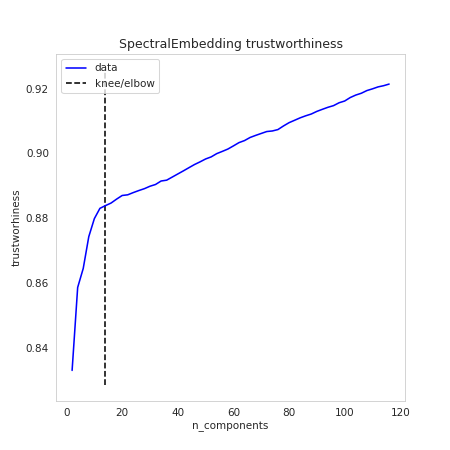

(14, 0.8839117004808638)

In [29]:
# max_components = 30
kneedle = KneeLocator(np.arange(2, max_components, 2), np.array(trustws_results_SE['n_components']), S=1, curve='concave', direction='increasing', interp_method='polynomial')
kneedle.plot_knee()
plt.title(emb_method.__name__  + ' trustworthiness')
plt.xlabel('n_components')
plt.ylabel('trustworhiness')
kneedle.knee, kneedle.knee_y

In [30]:
# #Save the dataframe with optimal dim
# good_dim_SE = int(np.squeeze(np.where(hyperparams_to_test['n_components'] == kneedle.knee)))
# X_SE = embeddings_results['n_components'][good_dim_SE] #pick the best (knee point) n_components
# X_SE_df = pd.DataFrame(X_SE, columns = ['Mode {}'.format(i) for i in range(X_SE.shape[1])])#, index = index_X)
# X_SE_df.to_csv('/home/rlevin/notebooks/notebooks/datadrivenmethodsforgemspoliocovid/data/interim/SE_' + str(X_SE.shape[1]) + 'D_' + STATE + '.csv')
# X_SE_df.shape

In [31]:
#Save the dataframe with optimal dim
good_dim_SE = int(np.squeeze(np.where(hyperparams_to_test['n_components'] == kneedle.knee)))
X_SE = embeddings_results_SE['n_components'][good_dim_SE] #pick the best (knee point) n_components
X_SE_df = pd.DataFrame(X_SE, columns = ['Mode {}'.format(i) for i in range(X_SE.shape[1])])#, index = index_X)
X_SE_df.to_csv('/home/rlevin/notebooks/notebooks/datadrivenmethodsforgemspoliocovid/data/interim/SE_' + str(X_SE.shape[1]) + 'D_' + STATE + '.csv')
X_SE_df.shape

(15719, 14)

In [32]:
%%time
#LLE
emb_method = LocallyLinearEmbedding
hyperparams_to_test = {'n_components': np.arange(2, 117, 2)}


errors_results_LLE, embeddings_results_LLE, trustws_results_LLE  = choose_dimension(X, emb_method, hyperparams_to_test, '',**{'n_neighbors': 200,
 'n_components': 2,
 'reg': 0.1, #Note here that we later ended up using reg 0.1, so setting it
 'eigen_solver': 'auto',
 'tol': 1e-06,
 'max_iter': 1000,
 'method': 'standard',
 'hessian_tol': 0.0001,
 'modified_tol': 1e-12,
 'neighbors_algorithm': 'auto',
 'random_state': None,
 'n_jobs': -1})

# #Uncomment the above!!!
# hyperparams_to_test = {'n_components': [14]}
# # colors = covid_clusters['x'].copy()

# errors_results_LLE, embeddings_results_LLE, trustws_results_LLE  = choose_dimension(X, emb_method, hyperparams_to_test, '',**{'n_neighbors': 200,
#  'n_components': 2,
#  'reg': 0.1, #Note here that we later ended up using reg 0.1, so setting it
#  'eigen_solver': 'auto',
#  'tol': 1e-06,
#  'max_iter': 1000,
#  'method': 'standard',
#  'hessian_tol': 0.0001,
#  'modified_tol': 1e-12,
#  'neighbors_algorithm': 'auto',
#  'random_state': None,
#  'n_jobs': -1})

here
Trying n_components=2
Trying n_components=4
Trying n_components=6
Trying n_components=8
Trying n_components=10
Trying n_components=12
Trying n_components=14
Trying n_components=16
Trying n_components=18
Trying n_components=20
Trying n_components=22
Trying n_components=24
Trying n_components=26
Trying n_components=28
Trying n_components=30
Trying n_components=32
Trying n_components=34
Trying n_components=36
Trying n_components=38
Trying n_components=40
Trying n_components=42
Trying n_components=44
Trying n_components=46
Trying n_components=48
Trying n_components=50
Trying n_components=52
Trying n_components=54
Trying n_components=56
Trying n_components=58
Trying n_components=60
Trying n_components=62
Trying n_components=64
Trying n_components=66
Trying n_components=68
Trying n_components=70
Trying n_components=72
Trying n_components=74
Trying n_components=76
Trying n_components=78
Trying n_components=80
Trying n_components=82
Trying n_components=84
Trying n_components=86
Trying n_c

In [36]:
save_obj(embeddings_results_LLE, 'embeddings_results_LLE')
save_obj(errors_results_LLE, 'errors_results_LLE')
save_obj(trustws_results_LLE, 'trustws_results_LLE')

In [32]:
emb_method = LocallyLinearEmbedding
hyperparams_to_test = {'n_components': np.arange(2, 117, 2)}
embeddings_results_LLE = load_obj('embeddings_results_LLE')
errors_results_LLE = load_obj('errors_results_LLE')
trustws_results_LLE = load_obj('trustws_results_LLE')

<IPython.core.display.Javascript object>


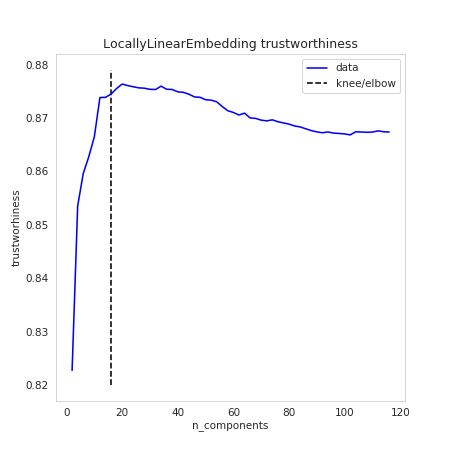

(16, 0.874457904844481)

In [33]:
kneedle = KneeLocator(np.arange(2, 117, 2), np.array(trustws_results_LLE['n_components']), S=1, curve='concave', direction='increasing', interp_method='polynomial')
kneedle.plot_knee()
plt.title(emb_method.__name__  + ' trustworthiness')
plt.xlabel('n_components')
plt.ylabel('trustworhiness')
kneedle.knee, kneedle.knee_y

In [34]:
# #Save the dataframe with optimal dim
# good_dim_LLE = int(np.squeeze(np.where(hyperparams_to_test['n_components'] == kneedle.knee)))
# X_LLE = embeddings_results['n_components'][good_dim_LLE] #pick the best (knee point) n_components
# X_LLE_df = pd.DataFrame(X_LLE, columns = ['Mode {}'.format(i) for i in range(X_LLE.shape[1])])#, index = index_X)
# X_LLE_df.to_csv('/home/rlevin/notebooks/notebooks/datadrivenmethodsforgemspoliocovid/data/interim/LLE_' + str(X_LLE.shape[1]) + 'D_' + STATE + '.csv')
# X_LLE_df.shape

In [35]:
good_dim_LLE = int(np.squeeze(np.where(hyperparams_to_test['n_components'] == kneedle.knee)))
X_LLE = embeddings_results_LLE['n_components'][good_dim_LLE] #pick the best (knee point) n_components
X_LLE_df = pd.DataFrame(X_LLE, columns = ['Mode {}'.format(i) for i in range(X_LLE.shape[1])])#, index = index_X)
X_LLE_df.to_csv('/home/rlevin/notebooks/notebooks/datadrivenmethodsforgemspoliocovid/data/interim/LLE_' + str(X_LLE.shape[1]) + 'D_' + STATE + '.csv')
X_LLE_df.shape

(15719, 16)

## Visualize SE, Isomap, LLE

2D Args: {'n_neighbors': 50, 'n_components': 2, 'n_jobs': -1}
3D Args: {'n_neighbors': 50, 'n_components': 3, 'n_jobs': -1}


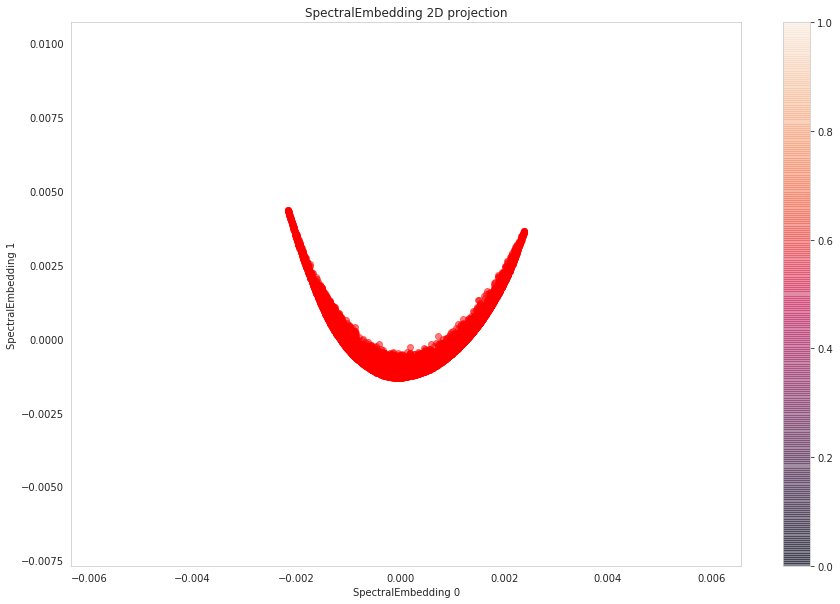

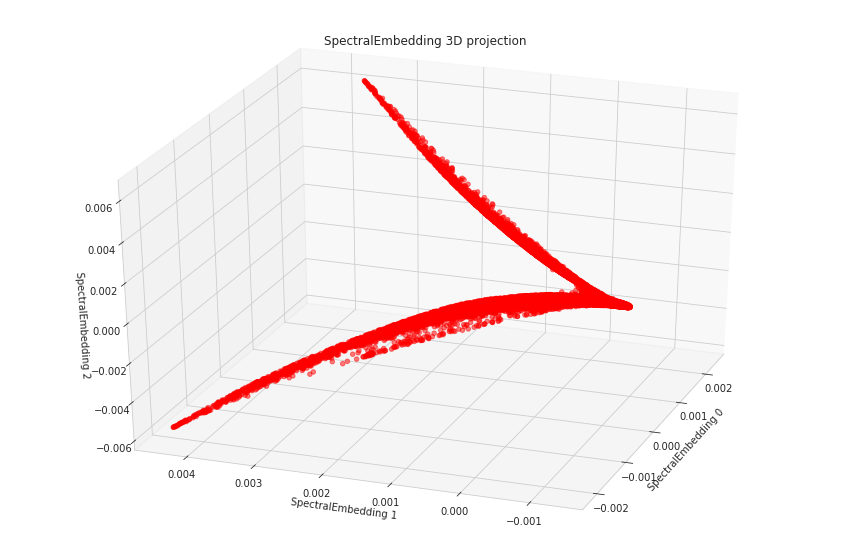

In [40]:
#Viz clustering on the emb
# filename_SE_clustering = FIGURES_ADDITIONAL_PATH + 'clustering'
# %%matplotlib notebook
%matplotlib inline
_ = viz_SE(X, 'red', filename = None, alpha = 0.5)

2D Args: {'n_neighbors': 50, 'n_components': 2, 'max_iter': 1000, 'n_jobs': -1}
3D Args: {'n_neighbors': 50, 'n_components': 3, 'max_iter': 1000, 'n_jobs': -1}


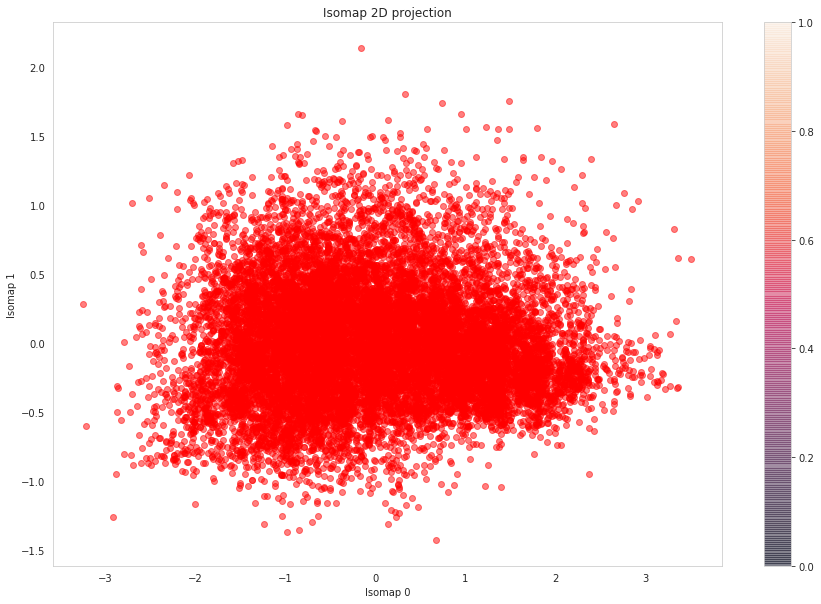

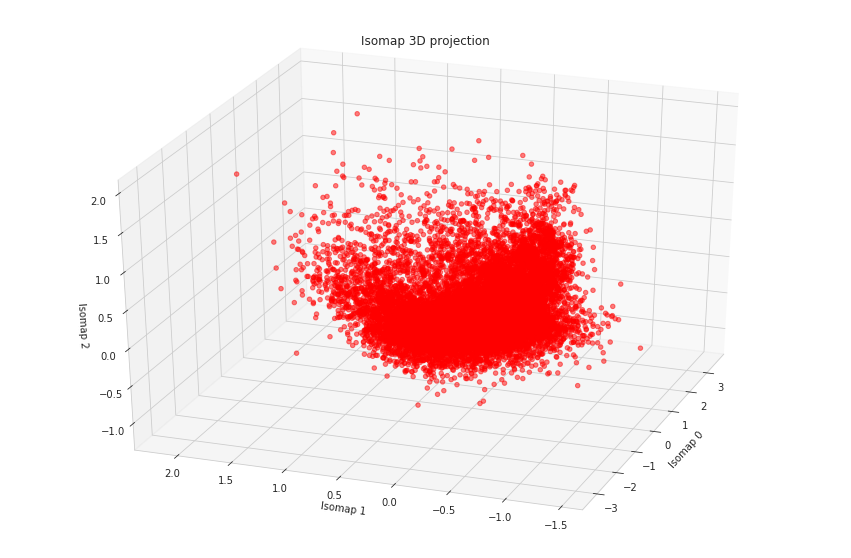

In [41]:
_ = viz_Isomap(X, 'red', filename = None, alpha = 0.5)

2D Args: {'n_neighbors': 200, 'n_components': 2, 'reg': 0.1, 'eigen_solver': 'auto', 'tol': 1e-06, 'max_iter': 1000, 'method': 'standard', 'hessian_tol': 0.0001, 'modified_tol': 1e-12, 'neighbors_algorithm': 'auto', 'random_state': None, 'n_jobs': -1}
3D Args: {'n_neighbors': 200, 'n_components': 3, 'reg': 0.1, 'eigen_solver': 'auto', 'tol': 1e-06, 'max_iter': 1000, 'method': 'standard', 'hessian_tol': 0.0001, 'modified_tol': 1e-12, 'neighbors_algorithm': 'auto', 'random_state': None, 'n_jobs': -1}


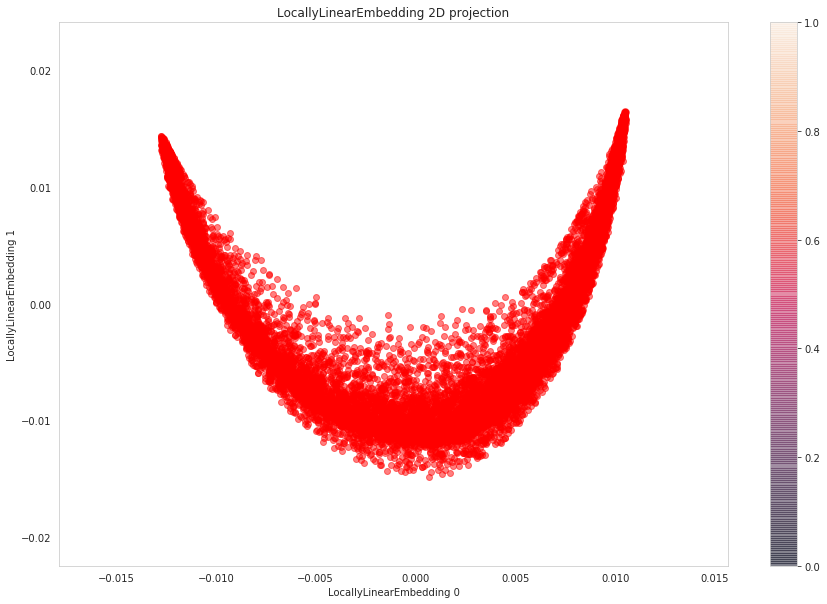

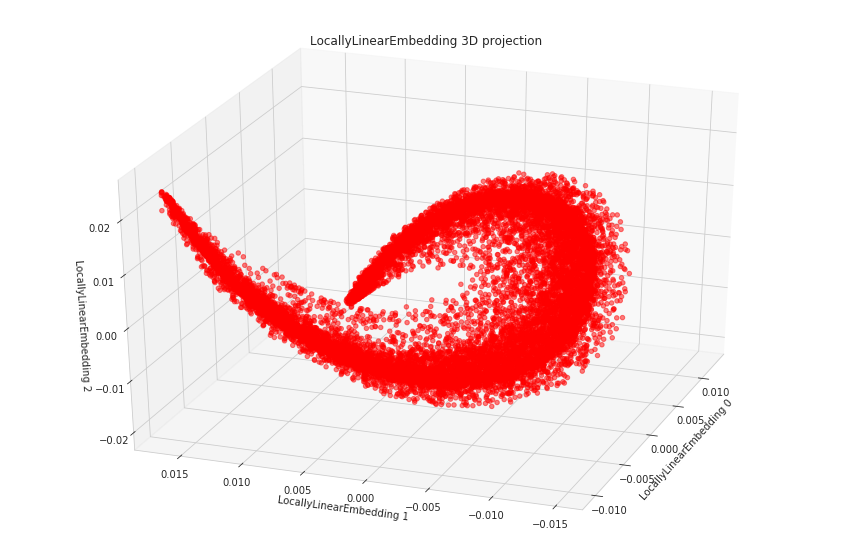

In [42]:
_ = viz_LLE(X, 'red', filename = None, alpha = 0.5)

## GMM clustering in R

In [36]:
# ro.r('install.packages("mclust")')
base = importr('base')
mclust = importr('mclust')
ro.r('set.seed(0)')

<rpy2.rinterface_lib.sexp.NULLType object at 0x7faf9fc7f0a0> [RTYPES.NILSXP]

In [67]:
def GMM_clustering_R(X_SE_df, method):
    """Function to check BIC and perform GMM clustering on embedded dataset"""
    #First, import r packages and fix random seed:
    base = importr('base')
    mclust = importr('mclust')
    ro.r('set.seed(0)')
    
    #Now, check BIC and make a plot
    num_components_to_try = pd.Series(np.arange(1,12)) #try up to 12 components
    with localconverter(ro.default_converter + pandas2ri.converter):
        ro.r('set.seed(0)')
        BIC_SE = mclust.mclustBIC(X_SE_df, G = num_components_to_try)
    
    model_names = ['EII', 'VII', 'EEI', 'VEI', 'EVI', 'VVI', 'EEE', 'EVE', 'VEE', 'VVE', 'EEV', 'VEV', 'EVV', 'VVV']
    sns.set(style="darkgrid")
    BIC_SE_df = pd.DataFrame(BIC_SE, columns = model_names)
#     plt.figure()
    BIC_SE_df.plot(marker = 'o')
    
    #Now, find the knee point of the optimal BIC plot (the best GMM parametrization)
    best_parametrization = BIC_SE_df.columns[BIC_SE_df.max().argmax()]
    kneedle = KneeLocator(num_components_to_try, BIC_SE_df[best_parametrization], S=1, curve='concave', direction='increasing', interp_method='polynomial')
#     plt.figure()
    kneedle.plot_knee()
    plt.title('GMM BIC on' + method.__name__)
    plt.xlabel('num_GMM_components')
    plt.ylabel('')
    print('Elbow point: {} components with BIC {}'.format(kneedle.knee, kneedle.knee_y))
    
    #Pick the best number of GMM components:
    best_num_components = kneedle.knee-1
    with localconverter(ro.default_converter + pandas2ri.converter):
        ro.r('set.seed(0)')
        mc = mclust.Mclust(X_SE_df, G = pd.Series([num_components_to_try[best_num_components]]))
        print(base.summary(mc))
        print(np.quantile(mc[15], [0, 0.25, 0.5, 0.75, 1]))
        mc_dict = convert_to_python_dict(mc)
        SE_model_name = mc_dict['modelName']
        print(SE_model_name)
        param = mc_dict['parameters']
        SE_means = np.array(convert_to_python_dict(param)['mean'])
        SE_uncertainty = np.array(mc_dict['uncertainty'])
        SE_z = np.array(convert_to_python_dict(mc)['z'])
        SE_clusters = np.array(convert_to_python_dict(mc)['classification'])
        SE_means = pd.DataFrame(SE_means, columns = ['V'+str(i+1) for i in range(SE_means.shape[1])])
#         np.array(mc[14])
#         SE_means = np.array(mc[12][1])
    return SE_clusters, SE_means, SE_z, SE_uncertainty

fitting ...
  |======================================================================| 100%


/home/rlevin/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


<IPython.core.display.Javascript object>


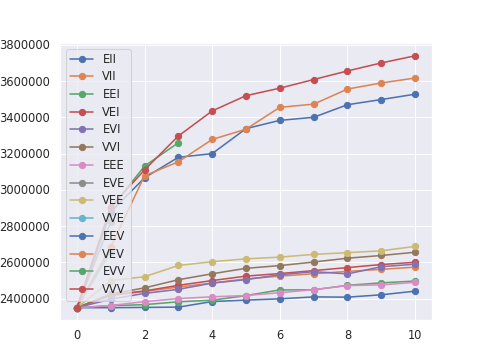

/home/rlevin/anaconda3/lib/python3.7/site-packages/kneed/knee_locator.py:246: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=figsize)


<IPython.core.display.Javascript object>


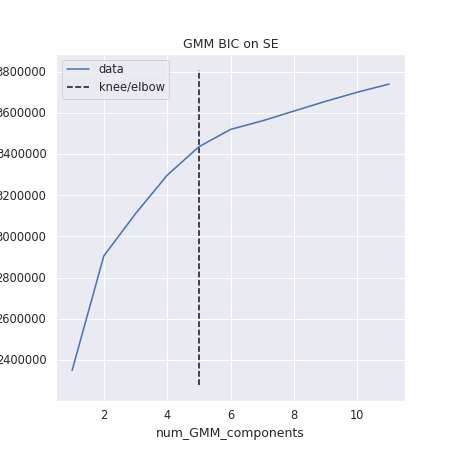

Elbow point: 5 components with BIC 3435158.771660732
fitting ...
  |======================================================================| 100%
---------------------------------------------------- 
Gaussian finite mixture model fitted by EM algorithm 
---------------------------------------------------- 

Mclust VVV (ellipsoidal, varying volume, shape, and orientation) model with 5
components: 

 log-likelihood     n  df     BIC     ICL
        1720473 15719 599 3435159 3435047

Clustering table:
   1    2    3    4    5 
3687 3960 1635 3283 3154 

[0.         0.         0.         0.         0.49578029]
['VVV']


In [64]:
SE_clusters, SE_means, SE_z, SE_uncertainty = GMM_clustering_R(X_SE_df)

fitting ...
  |======================================================================| 100%


/home/rlevin/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


<IPython.core.display.Javascript object>


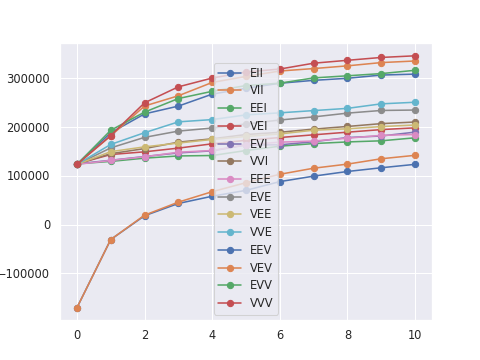

/home/rlevin/anaconda3/lib/python3.7/site-packages/kneed/knee_locator.py:246: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=figsize)


<IPython.core.display.Javascript object>


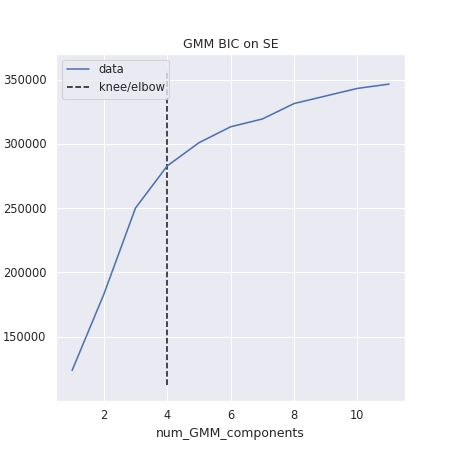

Elbow point: 4 components with BIC 282816.4121341074
fitting ...
  |======================================================================| 100%
---------------------------------------------------- 
Gaussian finite mixture model fitted by EM algorithm 
---------------------------------------------------- 

Mclust VVV (ellipsoidal, varying volume, shape, and orientation) model with 4
components: 

 log-likelihood     n  df      BIC      ICL
       144360.1 15719 611 282816.4 281726.9

Clustering table:
   1    2    3    4 
4742 3691 3584 3702 

[0.00000000e+00 1.60375679e-09 9.75146678e-06 2.81601511e-03
 5.95627541e-01]
['VVV']


In [65]:
isomap_clusters, isomap_means, isomap_z, isomap_uncertainty = GMM_clustering_R(X_isomap_df)

fitting ...
  |======================================================================| 100%


/home/rlevin/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


<IPython.core.display.Javascript object>


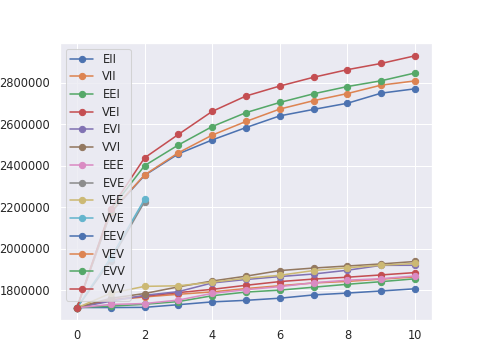

/home/rlevin/anaconda3/lib/python3.7/site-packages/kneed/knee_locator.py:246: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=figsize)


<IPython.core.display.Javascript object>


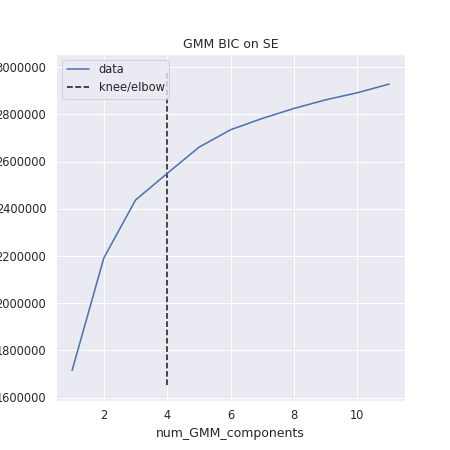

Elbow point: 4 components with BIC 2550106.756804902
fitting ...
  |======================================================================| 100%
---------------------------------------------------- 
Gaussian finite mixture model fitted by EM algorithm 
---------------------------------------------------- 

Mclust VVV (ellipsoidal, varying volume, shape, and orientation) model with 4
components: 

 log-likelihood     n  df     BIC     ICL
        1278005 15719 611 2550107 2549928

Clustering table:
   1    2    3    4 
4503 4766 2196 4254 

[0.00000000e+00 0.00000000e+00 0.00000000e+00 2.18713936e-13
 5.67680706e-01]
['VVV']


In [66]:
LLE_clusters, LLE_means, LLE_z, LLE_uncertainty = GMM_clustering_R(X_LLE_df)

### Interpretability: Centroids, Map, Embedding

In [41]:
#Start with LLE
# LLE_means = pd.DataFrame(LLE_means, columns = ['V'+str(i+1) for i in range(LLE_means.shape[1])])
LLE_means.head(2)

,V1,V2,V3,V4
0,0.008953,-0.001717,0.001513,-0.010598
1,0.006069,-0.003227,-0.008671,0.004984


In [42]:
N_TIMESERIES = 5
FIGURES_ADDITIONAL_PATH = 'exploratory/covid/interpretability/TX/'
closest_to_mean_samples, closest_to_mean_block_ids = find_closest_time_series(X_LLE_df, LLE_means, covid_ga_, n = N_TIMESERIES)
closest_to_mean_samples['V4'].shape
#CREATE SUBFOLDER FOR EACH METHOD THROUGH PYTHON!

(5, 117)

<IPython.core.display.Javascript object>


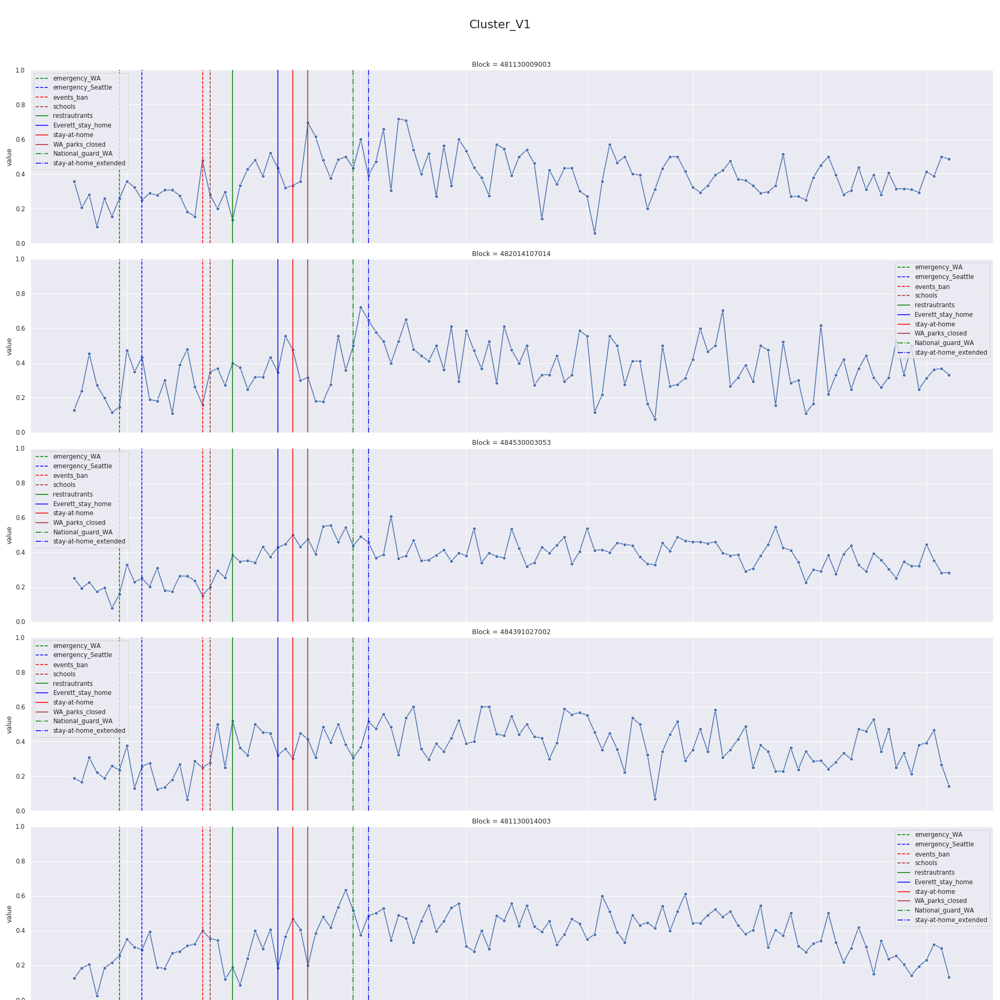

<IPython.core.display.Javascript object>


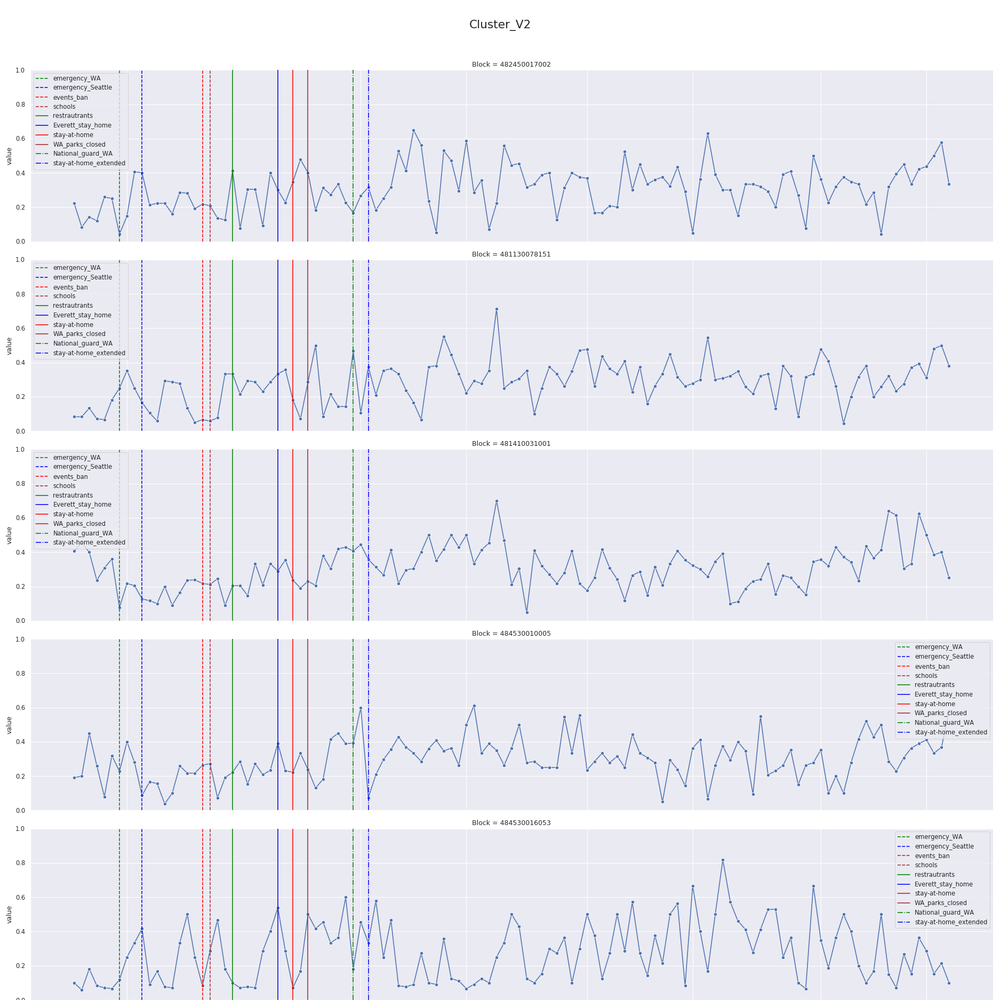

<IPython.core.display.Javascript object>


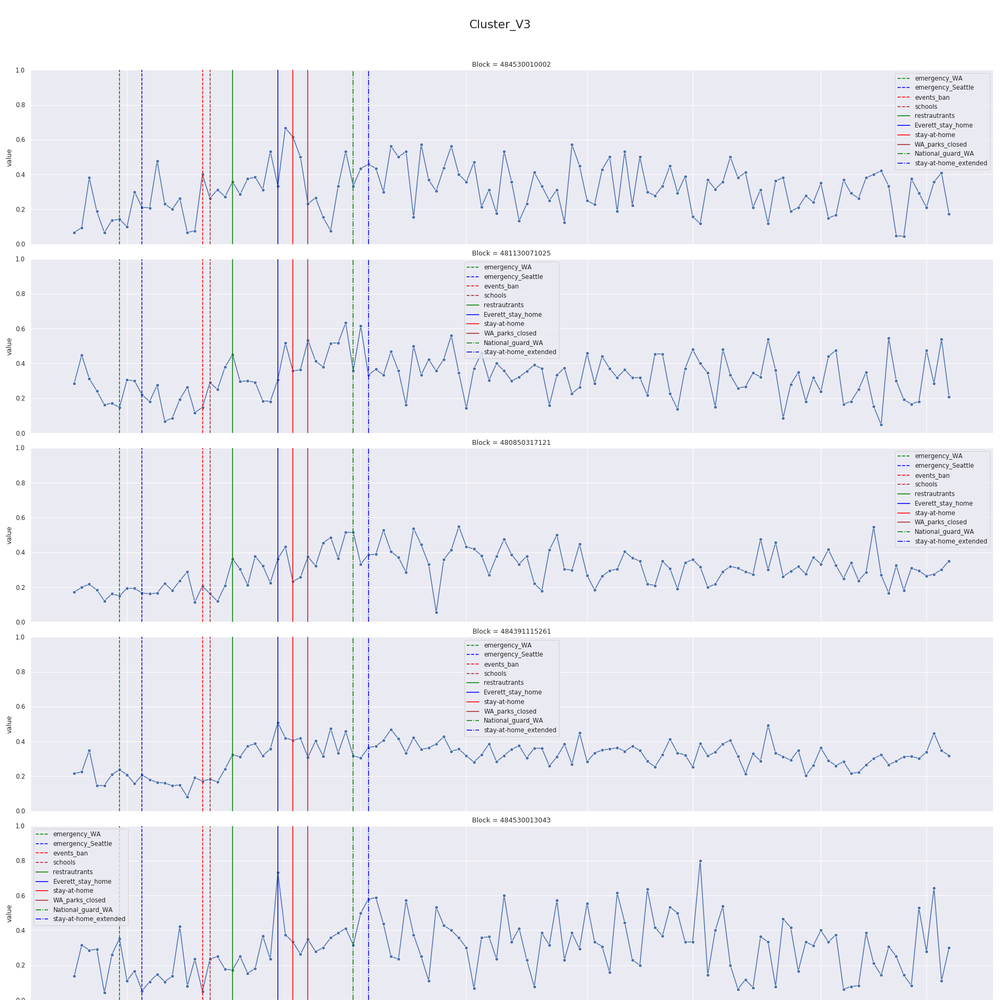

<IPython.core.display.Javascript object>


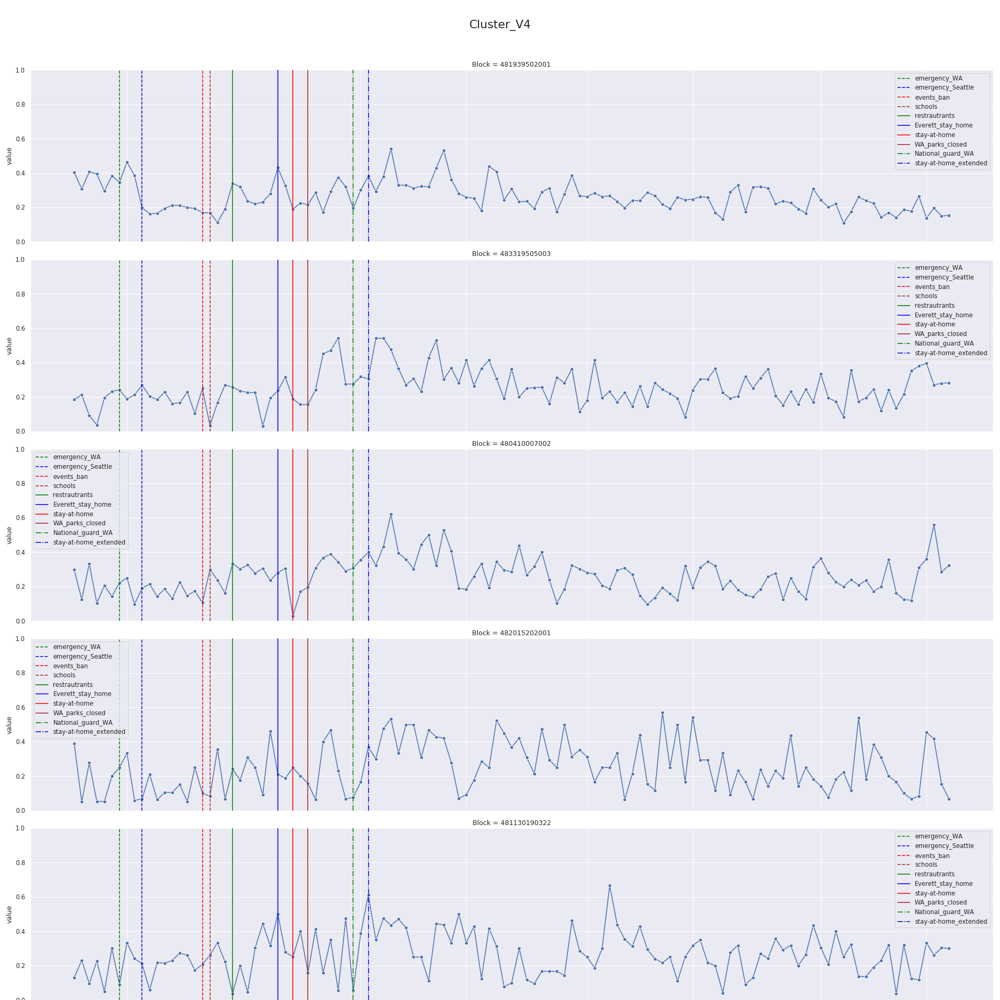

In [43]:
#Look at the closest time series
for cluster in LLE_means.columns:   
    filename_ts_plot = FIGURES_ADDITIONAL_PATH + 'LLE_closest_time_series_'+cluster+'.png'
    plot_time_series(closest_to_mean_samples[cluster], 'Cluster_'+cluster, filename = filename_ts_plot)

/mnt/c/Users/rlevin/Documents/notebooks/datadrivenmethodsforgemspoliocovid/src/dim_red_viz.py:59: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))


<IPython.core.display.Javascript object>


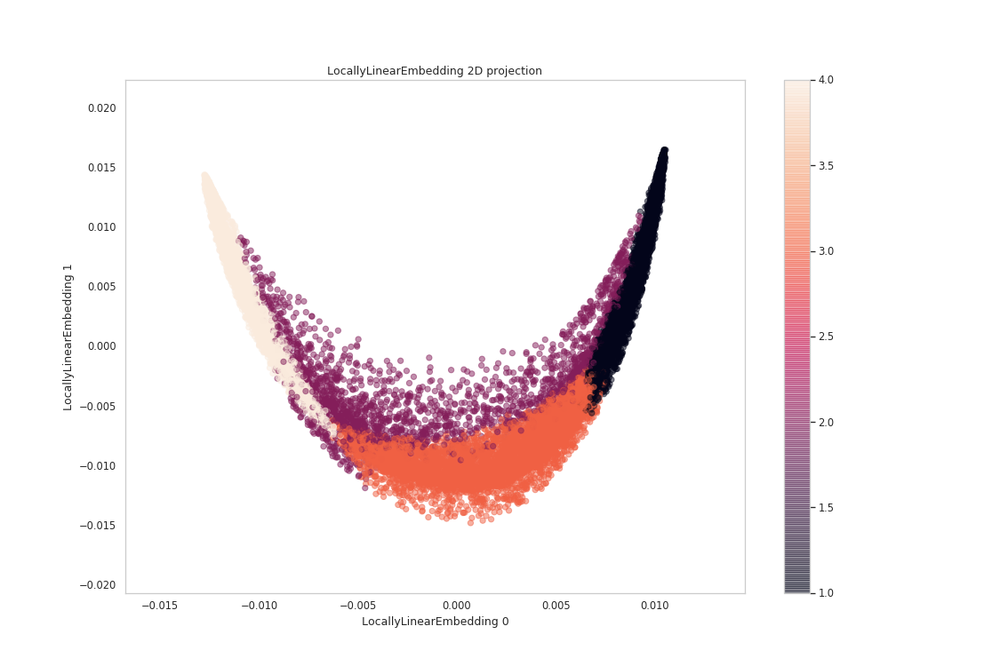

2D Args: {'n_neighbors': 200, 'n_components': 2, 'reg': 0.1, 'eigen_solver': 'auto', 'tol': 1e-06, 'max_iter': 1000, 'method': 'standard', 'hessian_tol': 0.0001, 'modified_tol': 1e-12, 'neighbors_algorithm': 'auto', 'random_state': None, 'n_jobs': -1}


/mnt/c/Users/rlevin/Documents/notebooks/datadrivenmethodsforgemspoliocovid/src/dim_red_viz.py:81: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))


<IPython.core.display.Javascript object>


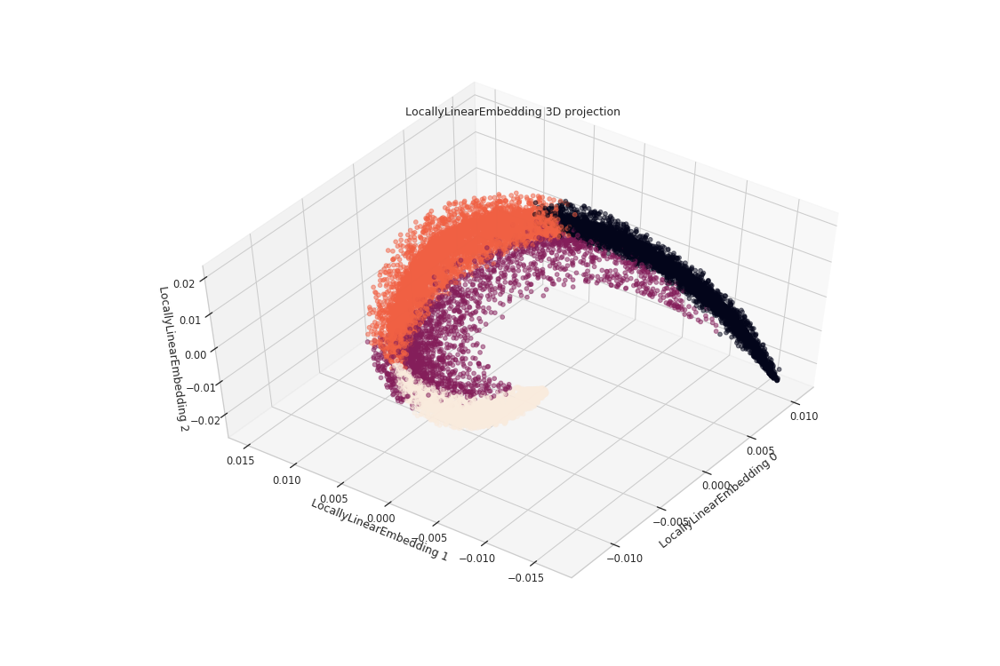

3D Args: {'n_neighbors': 200, 'n_components': 3, 'reg': 0.1, 'eigen_solver': 'auto', 'tol': 1e-06, 'max_iter': 1000, 'method': 'standard', 'hessian_tol': 0.0001, 'modified_tol': 1e-12, 'neighbors_algorithm': 'auto', 'random_state': None, 'n_jobs': -1}


In [44]:
%matplotlib inline
#Viz on the emb
#CHECK DISCREPANCY BETWEEN X AND X_DF_LLE
filename_LLE_clustering = FIGURES_ADDITIONAL_PATH + 'LLE_clustering'
X_2D_LLE, X_3D_LLE = viz_LLE(X, LLE_clusters, filename = filename_LLE_clustering, alpha = 0.5)

/home/rlevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:165: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


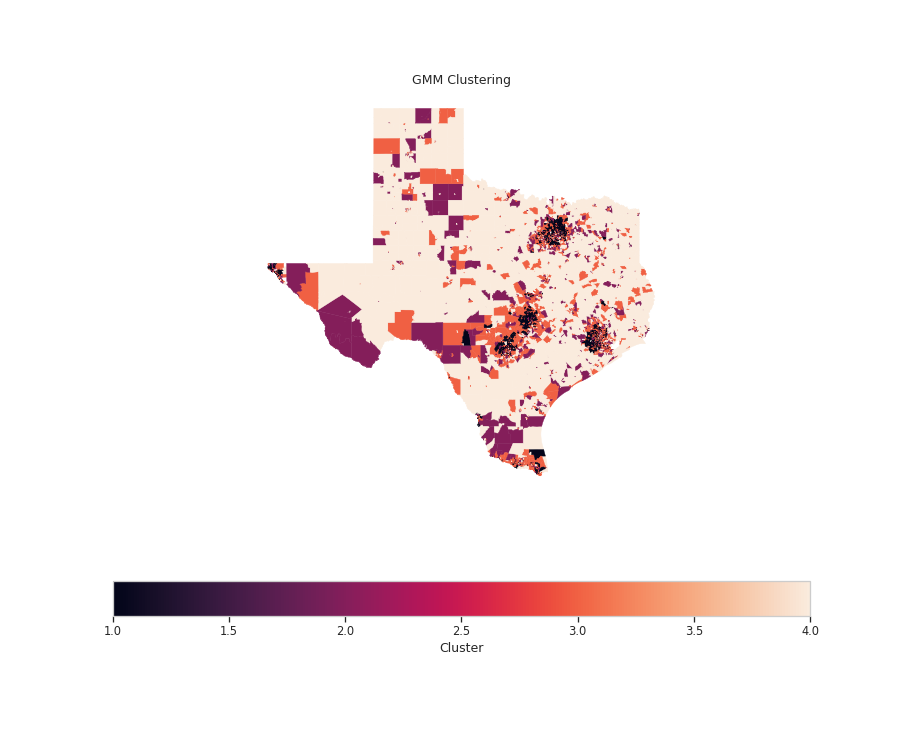

In [46]:
# #Viz clustering on the map
filename_LLE_clustering_map = FIGURES_ADDITIONAL_PATH + 'LLE_clustering_map'
viz_cluster_map(LLE_clusters, index_X, filename = filename_LLE_clustering_map)

In [47]:
#Now Isomap
# isomap_means = pd.DataFrame(isomap_means, columns = ['V'+str(i+1) for i in range(isomap_means.shape[1])])
isomap_means.head(2)

,V1,V2,V3,V4
0,-0.175613,1.343469,-1.329175,0.227147
1,-0.134418,-0.168430,-0.140039,0.488263


In [48]:
N_TIMESERIES = 5
FIGURES_ADDITIONAL_PATH = 'exploratory/covid/interpretability/TX/'
closest_to_mean_samples, closest_to_mean_block_ids = find_closest_time_series(X_isomap_df, isomap_means, covid_ga_, n = N_TIMESERIES)
closest_to_mean_samples['V4'].shape

(5, 117)

/home/rlevin/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:324: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


<IPython.core.display.Javascript object>


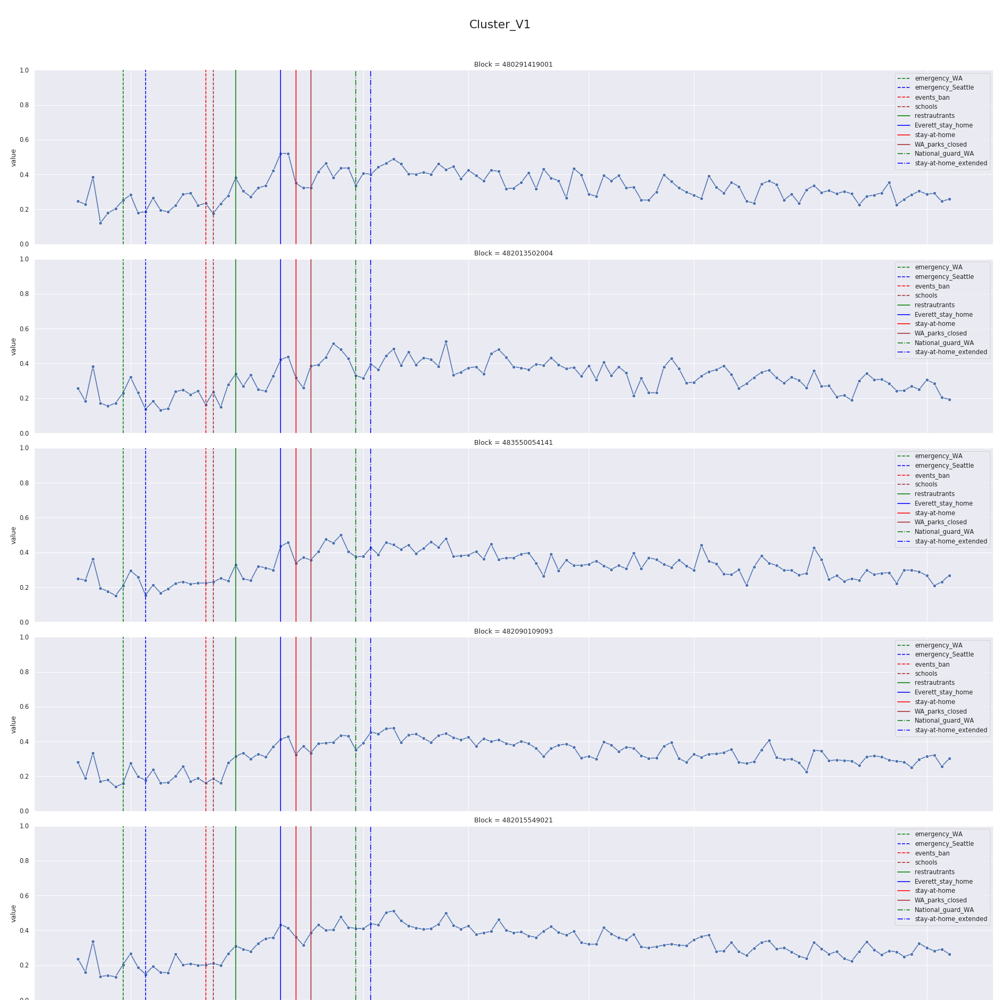

/home/rlevin/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:324: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


<IPython.core.display.Javascript object>


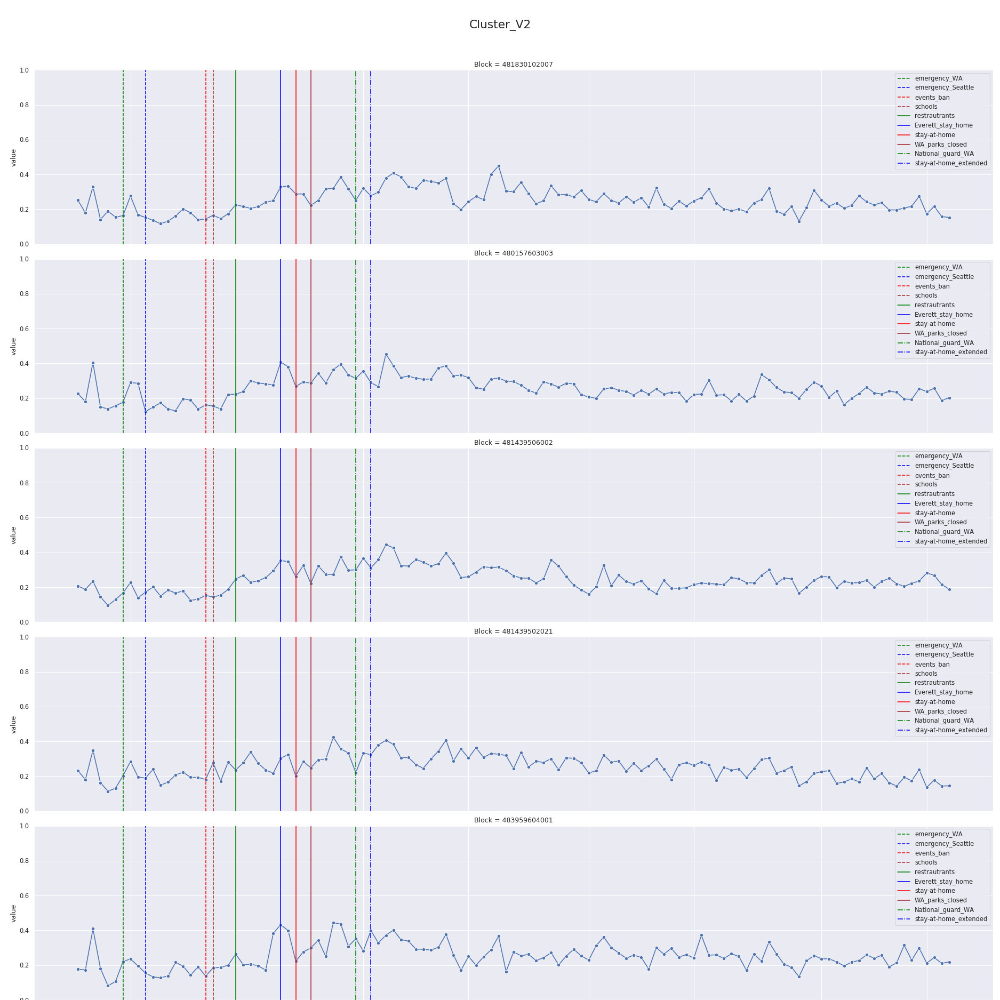

/home/rlevin/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:324: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


<IPython.core.display.Javascript object>


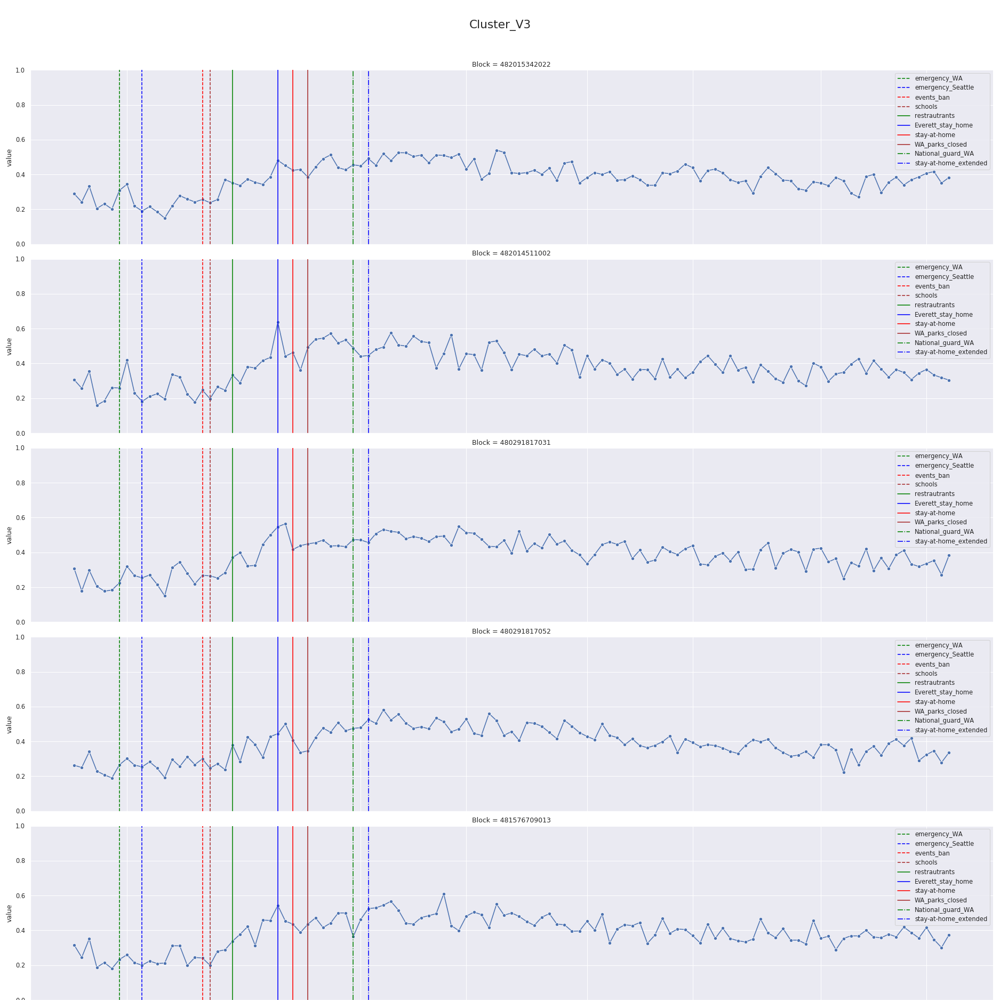

/home/rlevin/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:324: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


<IPython.core.display.Javascript object>


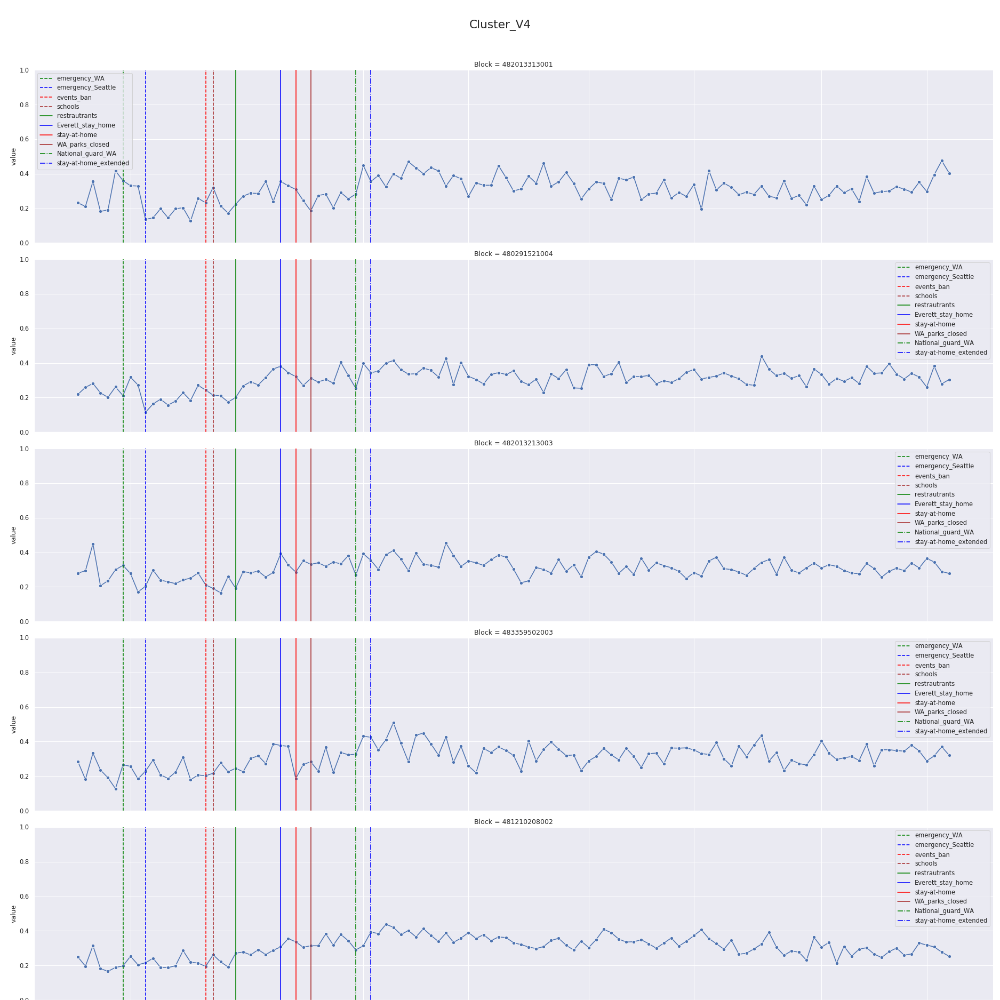

In [49]:
#Look at the closest time series
for cluster in isomap_means.columns:   
    filename_ts_plot = FIGURES_ADDITIONAL_PATH + 'isomap_closest_time_series_'+cluster+'.png'
    plot_time_series(closest_to_mean_samples[cluster], 'Cluster_'+cluster, filename = filename_ts_plot)

/mnt/c/Users/rlevin/Documents/notebooks/datadrivenmethodsforgemspoliocovid/src/dim_red_viz.py:59: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))


<IPython.core.display.Javascript object>


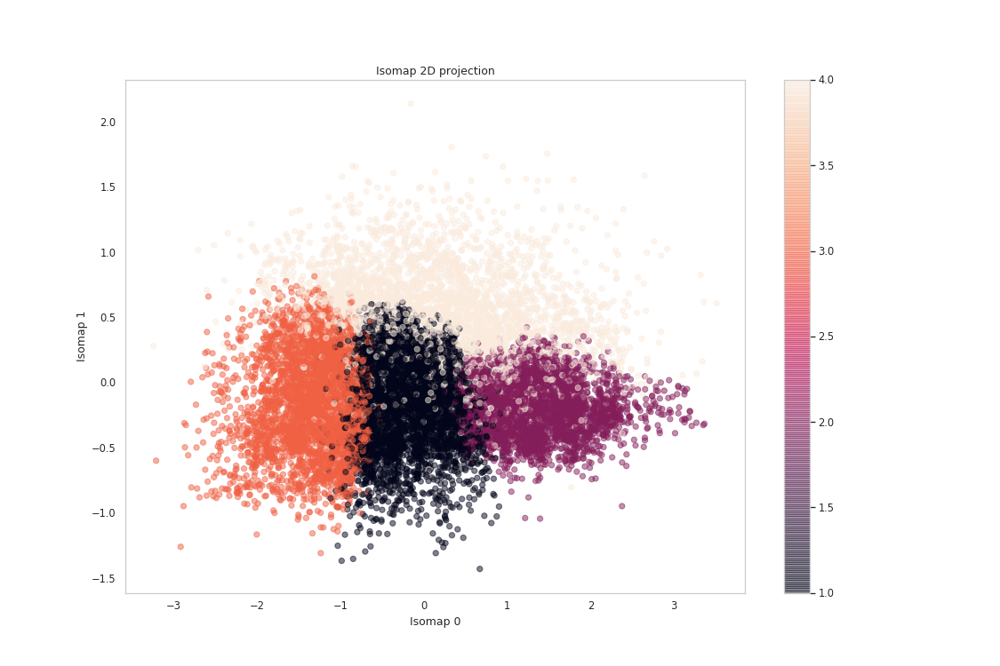

2D Args: {'n_neighbors': 50, 'n_components': 2, 'max_iter': 1000, 'n_jobs': -1}


/mnt/c/Users/rlevin/Documents/notebooks/datadrivenmethodsforgemspoliocovid/src/dim_red_viz.py:81: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))


<IPython.core.display.Javascript object>


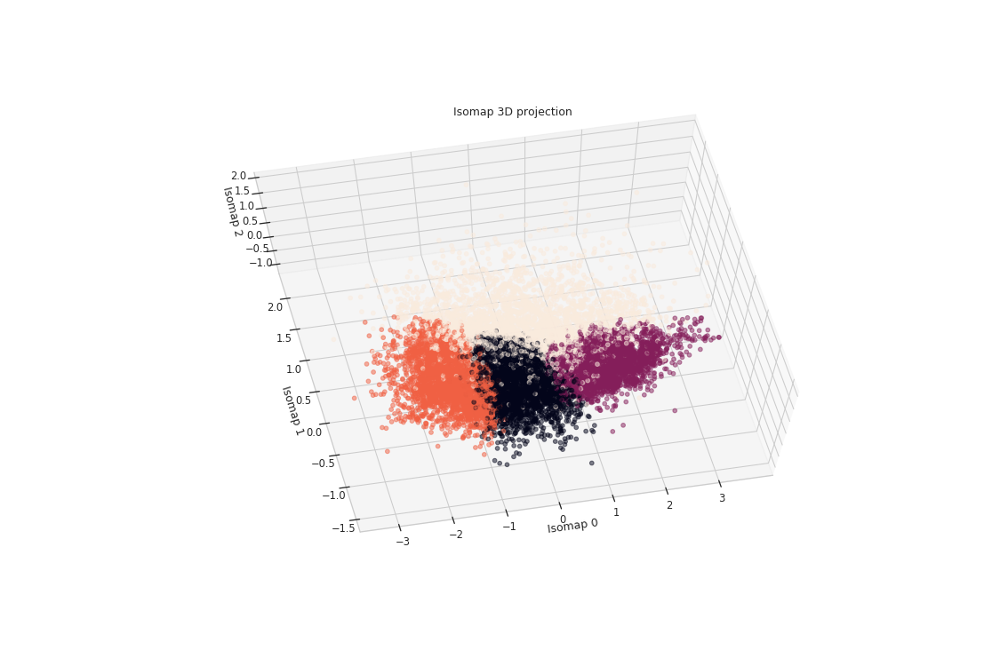

3D Args: {'n_neighbors': 50, 'n_components': 3, 'max_iter': 1000, 'n_jobs': -1}


In [50]:
#Viz on the emb
#CHECK DISCREPANCY BETWEEN X AND X_DF_LLE
filename_isomap_clustering = FIGURES_ADDITIONAL_PATH + 'isomap_clustering'
X_2D_isomap, X_3D_isomap = viz_Isomap(X, isomap_clusters, filename = filename_isomap_clustering, alpha = 0.5)

/home/rlevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:165: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


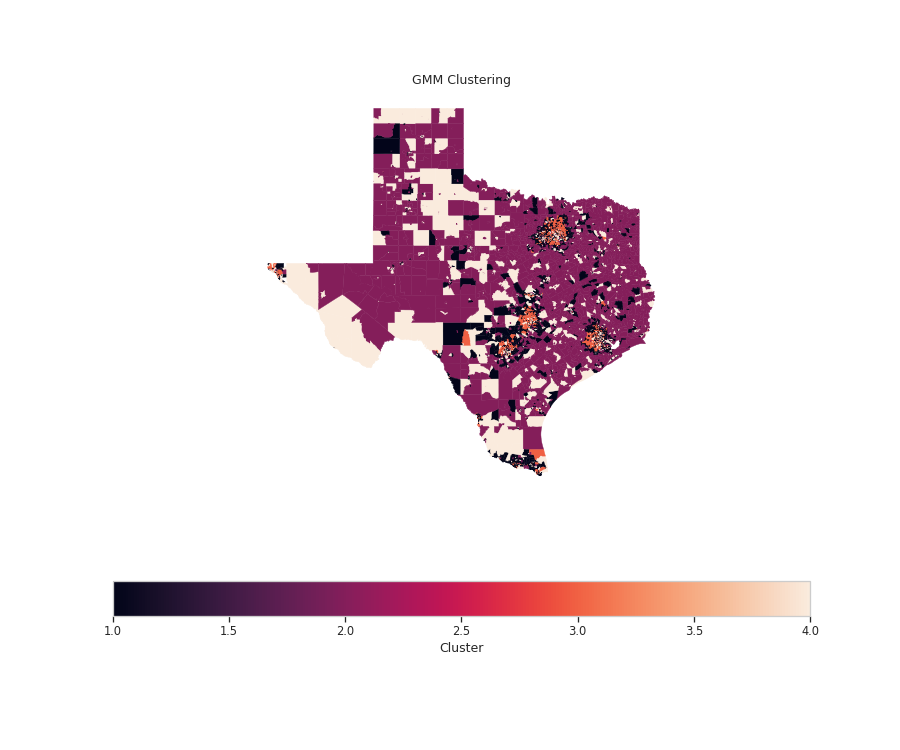

In [51]:
# #Viz clustering on the map
filename_isomap_clustering_map = FIGURES_ADDITIONAL_PATH + 'isomap_clustering_map'
viz_cluster_map(isomap_clusters, index_X, filename = filename_isomap_clustering_map)

In [328]:
# #Viz on the emb
# #CHECK DISCREPANCY BETWEEN X AND X_DF_LLE
# filename_isomap_clustering = FIGURES_ADDITIONAL_PATH + 'isomap_clustering_SE_viz'
# _ = viz_SE(X_isomap_df.values, isomap_clusters, filename = filename_isomap_clustering, alpha = 0.5)

In [68]:
#last, SE

# SE_means = pd.DataFrame(SE_means, columns = ['V'+str(i+1) for i in range(SE_means.shape[1])])
SE_means.head(2)

,V1,V2,V3,V4,V5
0,0.000445,-0.000634,0.000148,0.001604,-0.001467
1,-0.000949,-0.000752,-0.000035,0.000886,0.001183


In [69]:
N_TIMESERIES = 5
FIGURES_ADDITIONAL_PATH = 'exploratory/covid/interpretability/TX/'
closest_to_mean_samples, closest_to_mean_block_ids = find_closest_time_series(X_SE_df, SE_means, covid_ga_, n = N_TIMESERIES)
closest_to_mean_samples['V4'].shape

(5, 117)

/home/rlevin/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:324: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


<IPython.core.display.Javascript object>


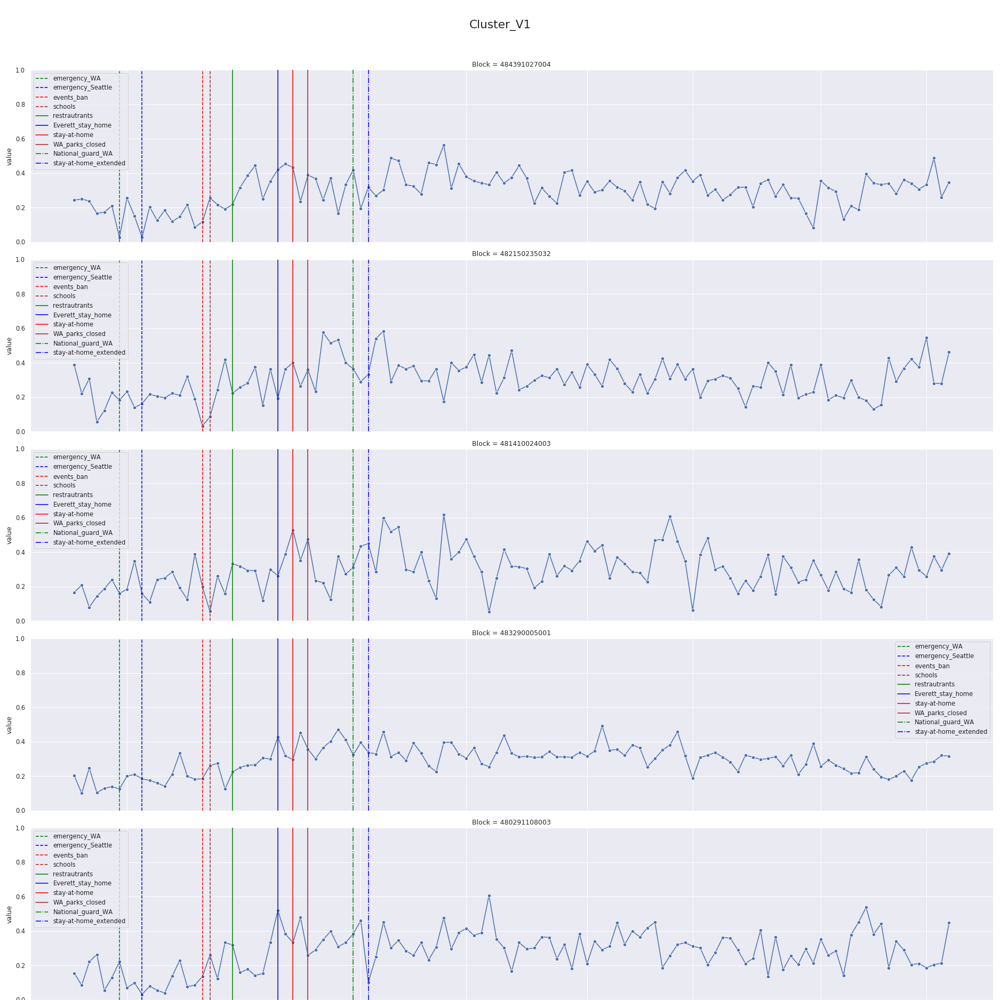

/home/rlevin/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:324: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


<IPython.core.display.Javascript object>


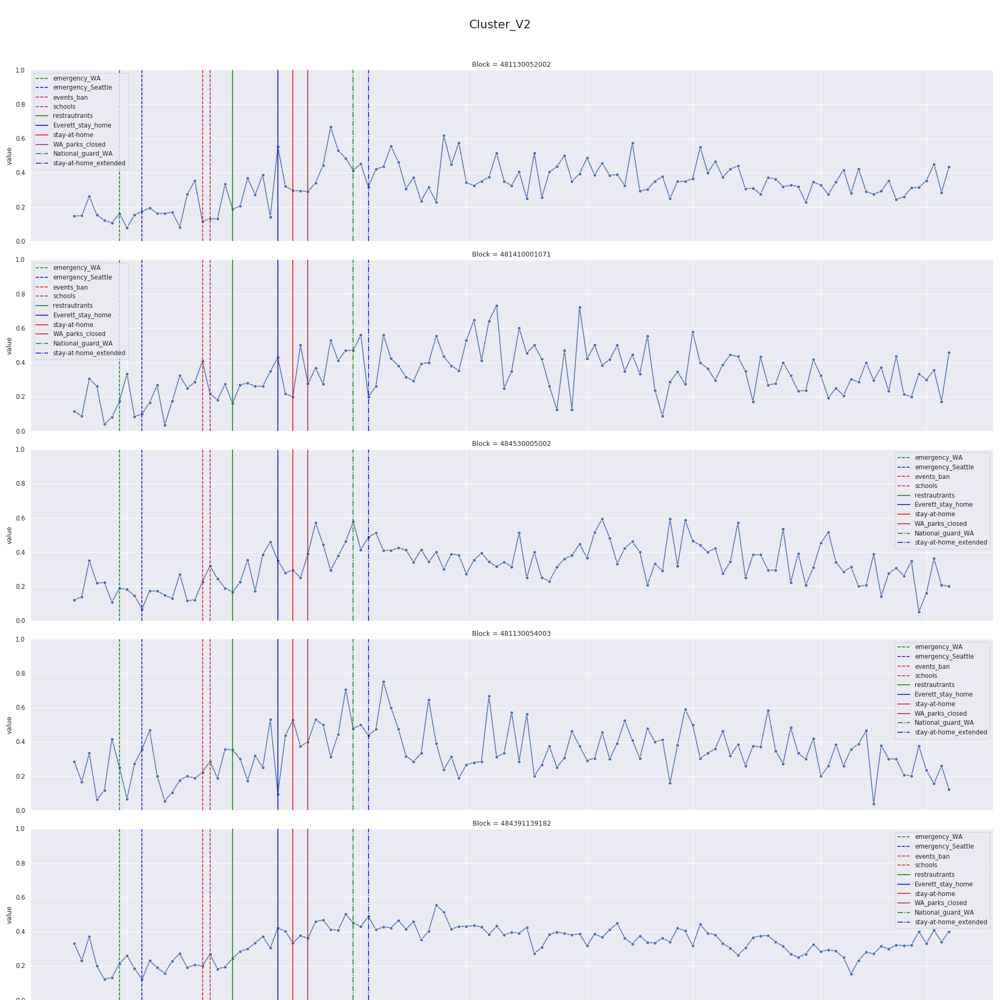

/home/rlevin/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:324: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


<IPython.core.display.Javascript object>


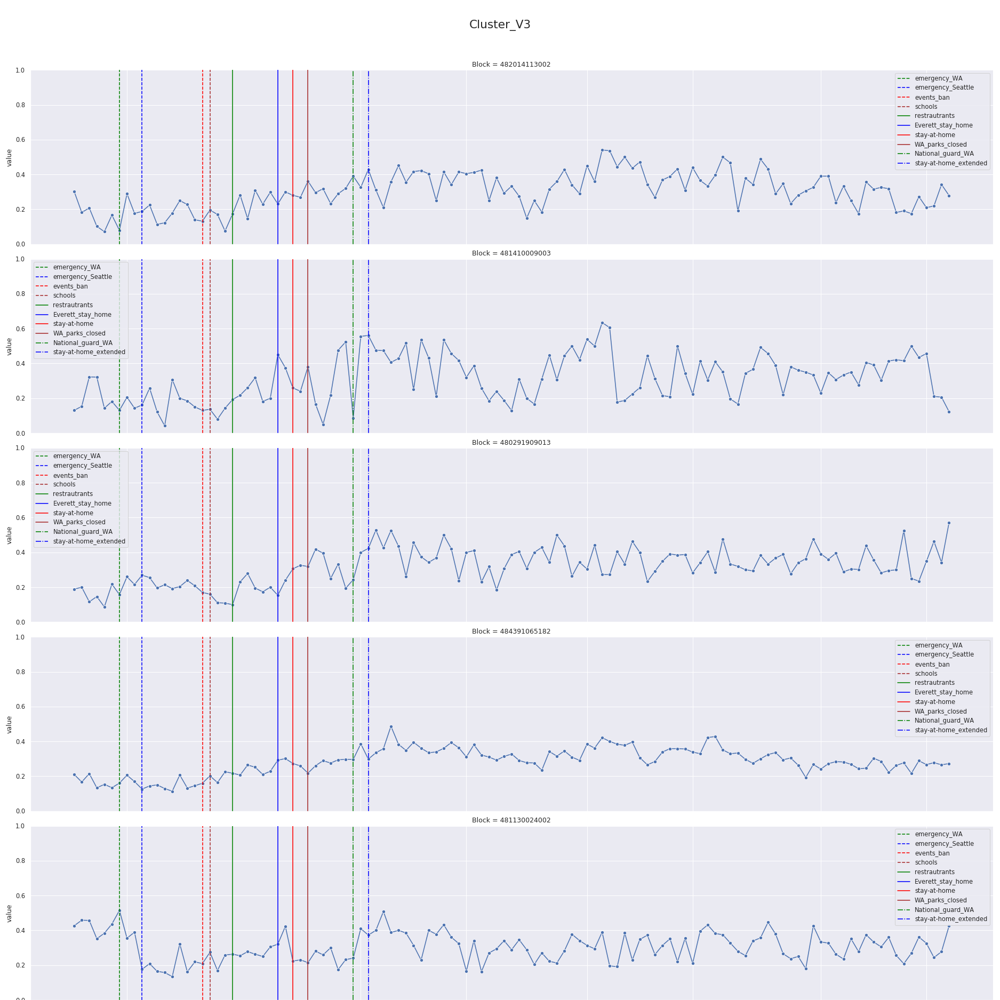

/home/rlevin/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:324: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


<IPython.core.display.Javascript object>


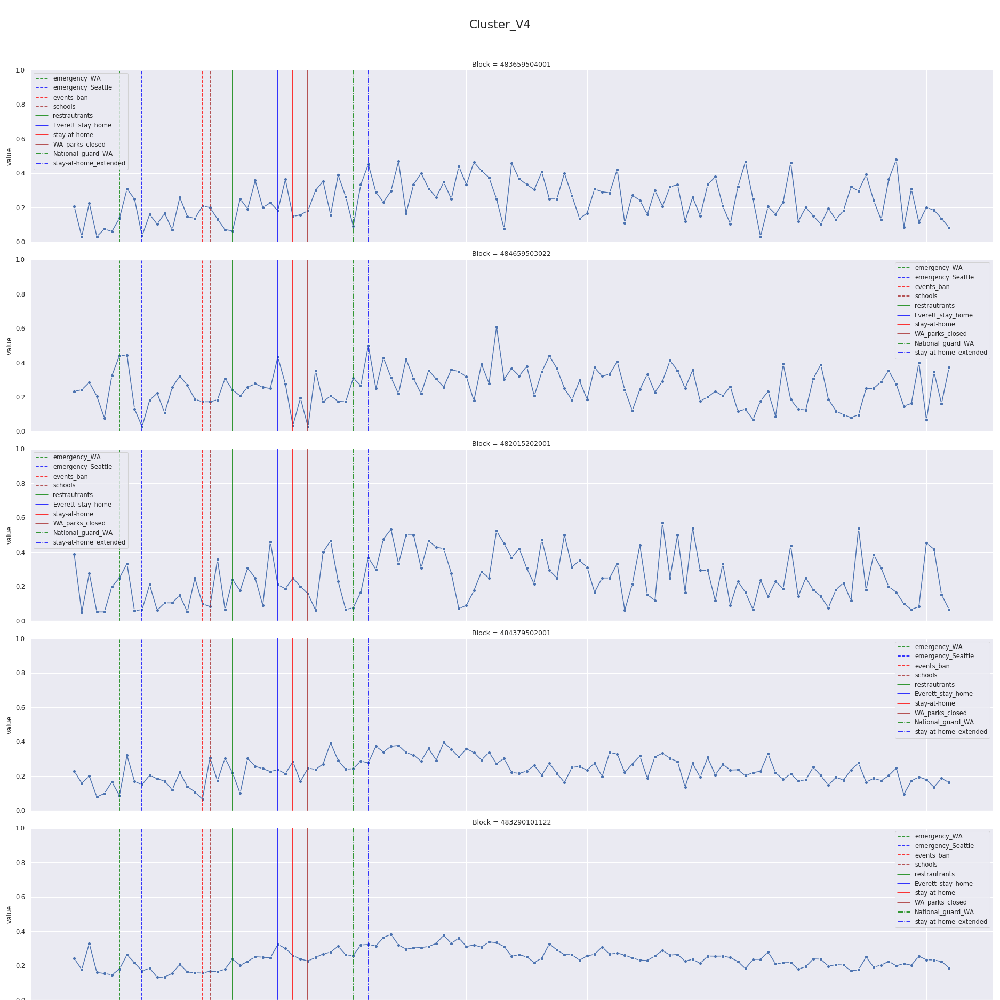

/home/rlevin/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:324: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


<IPython.core.display.Javascript object>


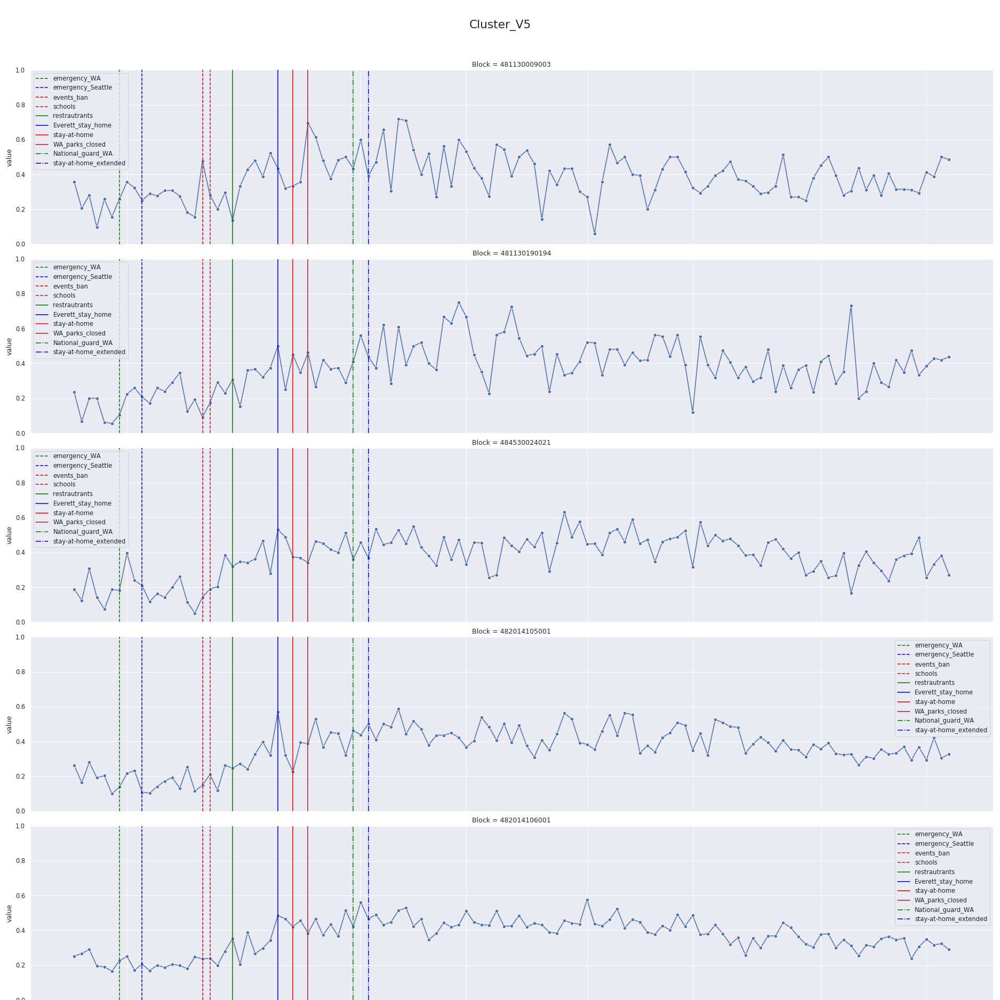

In [70]:
#Look at the closest time series
for cluster in SE_means.columns:   
    filename_ts_plot = FIGURES_ADDITIONAL_PATH + 'SE_closest_time_series_'+cluster+'.png'
    plot_time_series(closest_to_mean_samples[cluster], 'Cluster_'+cluster, filename = filename_ts_plot)

/mnt/c/Users/rlevin/Documents/notebooks/datadrivenmethodsforgemspoliocovid/src/dim_red_viz.py:59: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))


<IPython.core.display.Javascript object>


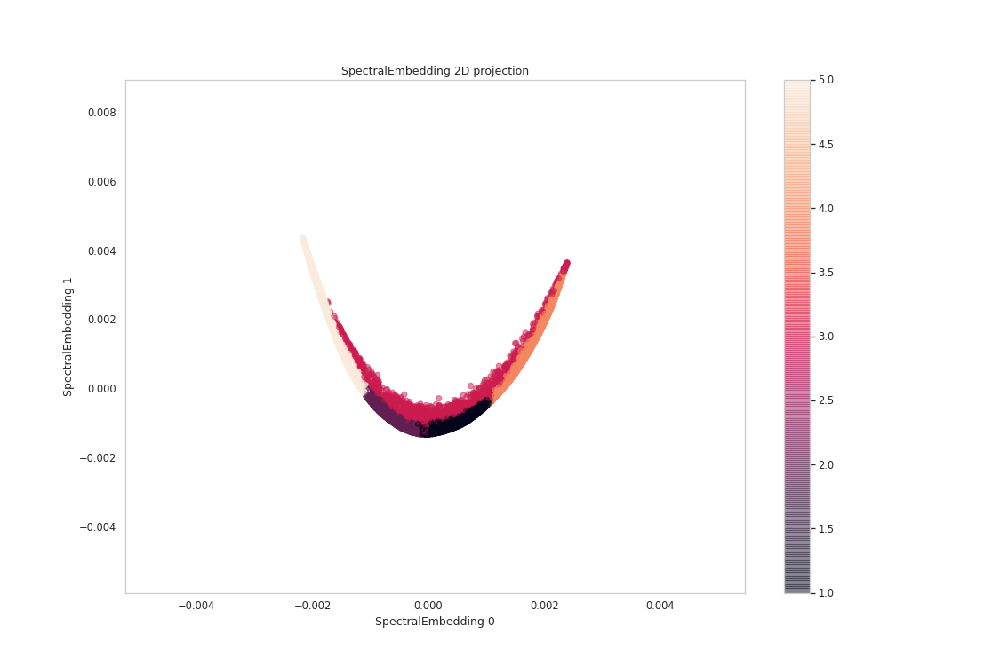

2D Args: {'n_neighbors': 50, 'n_components': 2, 'n_jobs': -1}


/mnt/c/Users/rlevin/Documents/notebooks/datadrivenmethodsforgemspoliocovid/src/dim_red_viz.py:81: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))


<IPython.core.display.Javascript object>


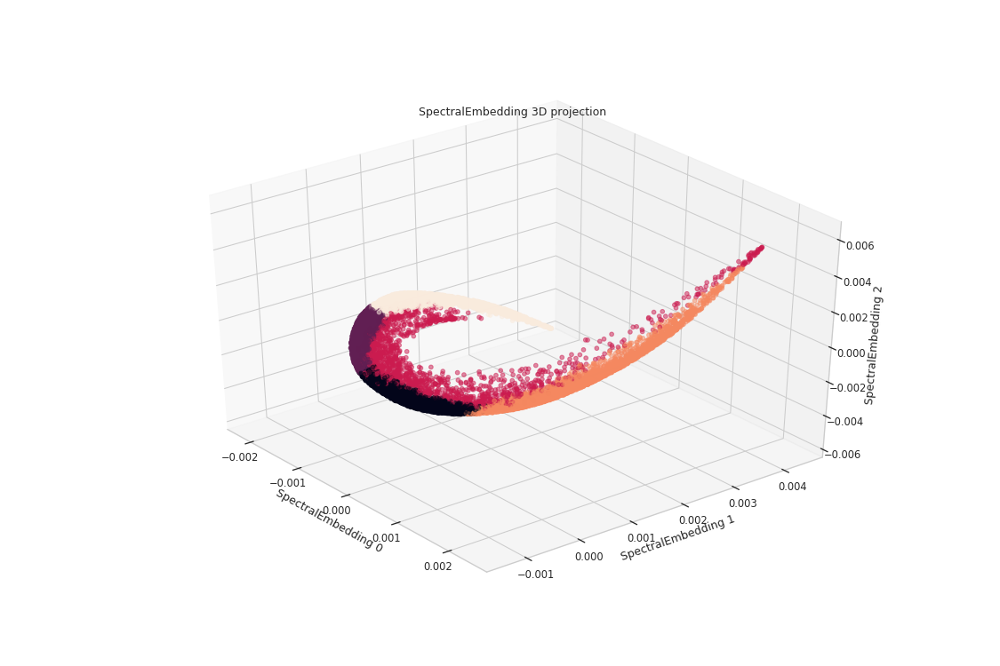

3D Args: {'n_neighbors': 50, 'n_components': 3, 'n_jobs': -1}


In [71]:
#Viz on the emb
#CHECK DISCREPANCY BETWEEN X AND X_DF_LLE
filename_SE_clustering = FIGURES_ADDITIONAL_PATH + 'SE_clustering'
X_2D_SE, X_3D_SE = viz_SE(X, SE_clusters, filename = filename_SE_clustering, alpha = 0.5)

/home/rlevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:165: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


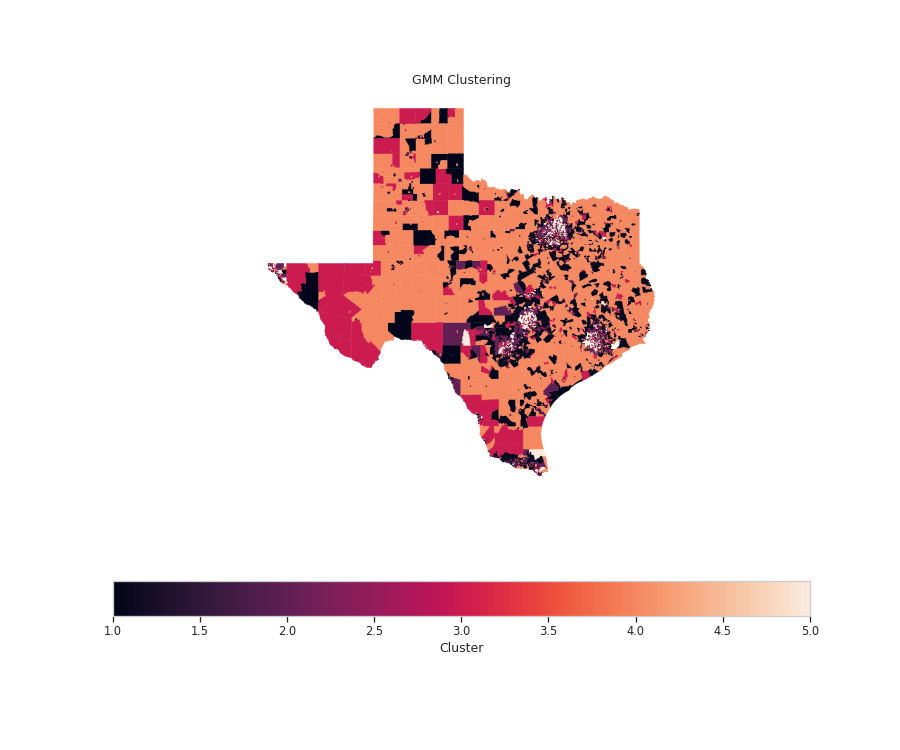

In [73]:
# #Viz clustering on the map
filename_SE_clustering_map = FIGURES_ADDITIONAL_PATH + 'SE_clustering_map'
viz_cluster_map(SE_clusters, index_X, filename = filename_SE_clustering_map)

In [336]:
ga_shape = gpd.read_file('/home/rlevin/notebooks/notebooks/datadrivenmethodsforgemspoliocovid/data/external/georgia_blockgroup_shape/tl_2017_13_bg.shp')

In [337]:
ga_shape.head()

,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
0,13,089,021202,2,130890212022,Block Group 2,G5030,S,2213448,79182,+33.9151116,-084.3275107,"POLYGON ((-84.33827 33.91816, -84.33799 33.918..."
1,13,089,021204,1,130890212041,Block Group 1,G5030,S,412353,0,+33.8884823,-084.2911951,"POLYGON ((-84.29465 33.89111, -84.29463 33.891..."
2,13,089,021208,2,130890212082,Block Group 2,G5030,S,1124763,0,+33.9104582,-084.3053062,"POLYGON ((-84.31090 33.91140, -84.31067 33.911..."
3,13,021,013102,3,130210131023,Block Group 3,G5030,S,1005267,0,+32.7925292,-083.6973617,"POLYGON ((-83.70755 32.79474, -83.70754 32.794..."
4,13,021,013102,4,130210131024,Block Group 4,G5030,S,807521,0,+32.7897449,-083.7020433,"POLYGON ((-83.70770 32.78788, -83.70768 32.788..."


In [339]:
# ga_shape.TRACTCE.value_counts()